# Production MD Analysis (Updated)

Updated version of `analysis.ipynb`: exploratory per-sequence and
group-comparison analysis of production MD trajectories. Adds a
radius-of-gyration pocket-vs-whole-protein comparison (27 consensus
pocket residues, Leonard et al. 2024) not present in the original
notebook; otherwise covers the same RMSD/Rg/SASA/RMSF, Pro88
omega-dihedral, and gate-latch (P88-L117 / P88-R116) analyses, including
a 100%-vs-50%-frames comparison and a temporal convergence analysis
(equilibration cutoff and production-length sensitivity). Reads GROMACS
`.xvg` outputs from each sequence's production run directory; several
cells duplicate small loader/helper functions (get_data, load_timeseries,
truncate_label, ...) with slightly different signatures for different
metrics or trajectory selections.

In [14]:
import glob
import re
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import re
from matplotlib.patches import Patch

In [15]:
cwd = os.getcwd()
cwd

'/Users/ivanatang/Developer/biosensors'

In [16]:
legend_fontsize = 6
title_fontsize = 10
ax_fontsize = 9
alpha_raw = 0.30
alpha_avg = 1
colors = ['C0', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6']
tab20 = ['#085993', '#8ea6c6', # blue
         '#d76100', '#d99a59', # orange
         '#208108', '#79be6b', # green
         '#b5090a', '#d77876', # red
         '#744a9c', '#a490b3', # purple
         '#6d392e', '#a37d75', # brown
         '#c159a1', '#d495b0', # pink
         '#606060', '#a6a6a6', # grey
         '#9b9c00', '#b9ba6f', # lime green
         '#229dad', '#7eb9c2'] # cyan
palette = ['#ffd30d', '#fca43f', '#744a9c', '#ff2005', '#ff1ea4', '#b745ff', '#148ec7', '#48dcea', '#526df9', '#28d683', '#606060', '#000000']
#28d683#07aaf5

In [17]:
def get_data(file):
    """Parses a two-column .xvg file, skipping GROMACS header lines.

    Args:
        file (str): Path to a GROMACS .xvg file.

    Returns:
        tuple[numpy.ndarray, numpy.ndarray]: (x, y) columns as float arrays.
        Rows that aren't purely numerical are skipped.
    """
    x_data = []
    y_data = []
    
    with open(file, 'r') as f:
        for line in f:
            if not line.startswith(('@', '#')):  # Skip header lines
                parts = line.strip().split()
                if len(parts) >= 2:  # Ensure there are at least two columns of data
                    try:
                        x_data.append(float(parts[0]))
                        y_data.append(float(parts[1]))
                    except ValueError:
                        # Handle cases where data might not be purely numerical
                        continue
    return np.array(x_data), np.array(y_data)

In [18]:
def summary_stats(data):
    """Computes mean, standard deviation, min, and max of an array.

    Args:
        data: Array-like of numeric values.

    Returns:
        tuple[float, float, float, float]: (mean, std, min, max).
    """
    data_mean = np.mean(data)
    data_std = np.std(data)
    data_min = np.min(data)
    data_max = np.max(data)
    
    return data_mean, data_std, data_min, data_max

In [19]:
def mask(x, y, medoid_time_ps, time_tol_ps=1.0):
    """Removes the medoid frame (by time) from a timeseries.

    Args:
        x: Time values (ps).
        y: Data values aligned to `x`.
        medoid_time_ps (float): Time of the medoid frame, in ps.
        time_tol_ps (float): Tolerance around medoid_time_ps to exclude
            (default: 1.0).

    Returns:
        tuple: (x, y) with the medoid frame removed.
    """
    mask = np.abs(x - medoid_time_ps) > time_tol_ps
    x_filt = x[mask]
    y_filt = y[mask]

    return x_filt, y_filt

In [20]:
def moving_average(y, window, center=True):
    """Smooths a series with a moving average, using reflection padding.

    Args:
        y: Array-like of values to smooth.
        window (int): Window size in points; forced odd if `center` is
            True (needed for symmetric smoothing).
        center (bool): Whether to center the window (default: True).

    Returns:
        numpy.ndarray: Smoothed series.

    Raises:
        ValueError: `window` is less than 1.
    """
    y = np.asarray(y, dtype=float)

    if window < 1:
        raise ValueError("window must be >= 1")

    if center and window % 2 == 0:
        window += 1  # force odd for symmetric smoothing

    pad = window // 2 if center else 0
    if pad > 0:
        y_pad = np.pad(y, pad_width=pad, mode="reflect")
    else:
        y_pad = y

    kernel = np.ones(window, dtype=float) / window
    y_smooth = np.convolve(y_pad, kernel, mode="valid")

    return y_smooth

## Binder

,Binder,Full sim frames,Full sim mean,Full sim SD,Full sim min,Full sim max,Cropped frames,Cropped mean,Cropped SD,Cropped min,...,Rg frames,Rg mean,Rg SD,Rg min,Rg max,SASA frames,SASA mean,SASA SD,SASA min,SASA max
0,seq16,13334,0.146833,0.019438,0.000618,0.230741,12266,0.136789,0.024458,5.000000e-07,...,12266,1.666760,0.007742,1.640221,1.693609,12266,103.767788,2.000128,96.272,112.149
1,seq14,13334,0.153927,0.017963,0.000491,0.240179,12266,0.138921,0.020535,8.000000e-07,...,12266,1.672168,0.006959,1.646995,1.699482,12266,104.494860,1.620451,98.698,111.134
2,seq10,13334,0.136840,0.018304,0.000486,0.209483,12266,0.164647,0.018681,5.000000e-07,...,12266,1.669331,0.006896,1.646308,1.694651,12266,102.982709,1.883046,96.315,111.941
3,seq17,13334,0.167803,0.017263,0.000502,0.234591,12266,0.123314,0.020087,5.000000e-07,...,12266,1.668521,0.006560,1.644968,1.690490,12266,102.891292,1.963062,96.777,110.286
4,seq39,13334,0.138159,0.022094,0.000528,0.218603,12266,0.139610,0.024482,5.000000e-07,...,12266,1.666041,0.007089,1.642214,1.691904,12266,103.416050,1.934163,96.764,111.814
5,seq42,13334,0.149494,0.021379,0.000495,0.208048,12266,0.185367,0.023151,8.000000e-07,...,12266,1.676173,0.006469,1.654089,1.703646,12266,103.095220,1.881992,95.688,110.771
6,pair_3069_binder,13334,0.213554,0.046708,0.000495,0.333177,12266,0.196134,0.042663,5.000000e-07,...,12266,1.674501,0.008246,1.645942,1.704094,5812,104.493703,2.105409,97.891,112.060
7,pair_3070_binder,13334,0.157065,0.021292,0.000508,0.240329,12266,0.156267,0.020316,8.000000e-07,...,12266,1.668291,0.008079,1.638123,1.702363,12266,104.976247,2.173621,98.002,112.740
8,pair_3074_binder,13334,0.185592,0.025557,0.000551,0.270925,12266,0.177221,0.038666,5.000000e-07,...,12266,1.673846,0.011346,1.639119,1.711212,12266,106.230935,2.227733,97.783,114.682
9,pair_3092_binder,13334,0.150005,0.016419,0.000490,0.226925,12266,0.167192,0.016306,5.000000e-07,...,12266,1.668871,0.006393,1.644518,1.694885,12266,103.988059,1.810484,97.637,111.665


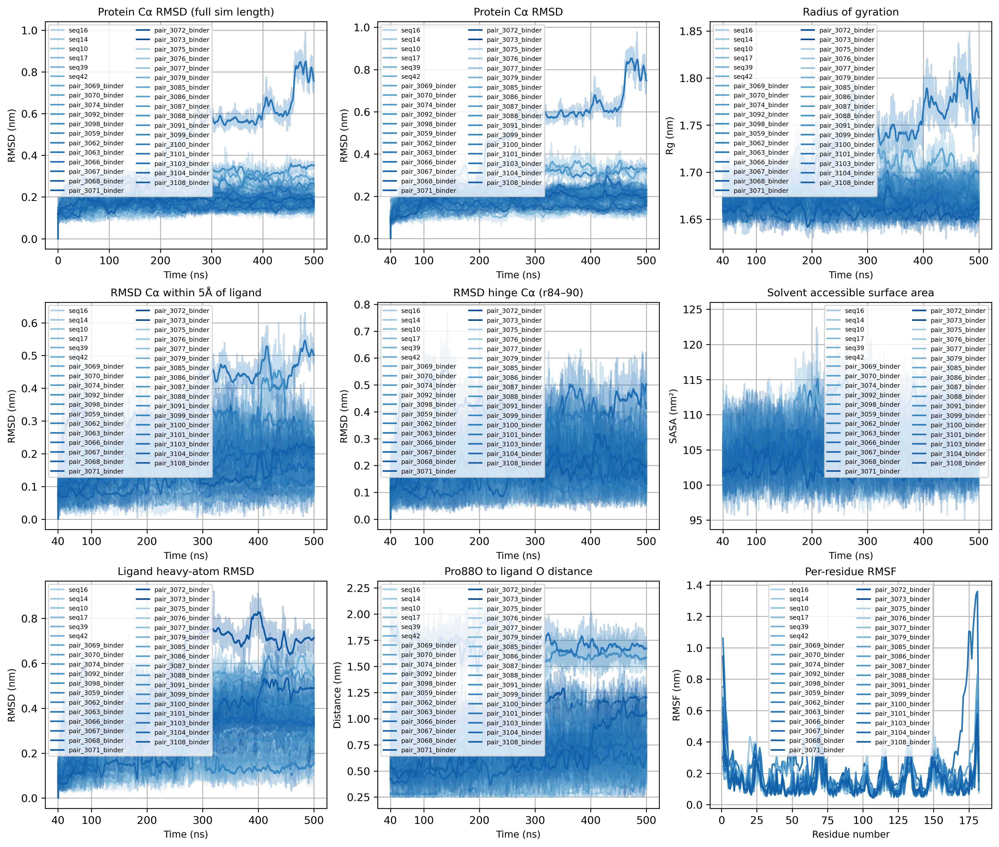

In [21]:
t0 = 40012.5

# ── Legacy binders ──────────────────────────────────────────────────────────
legacy_binder_ids = ['seq16', 'seq14', 'seq10', 'seq17', 'seq39', 'seq42']
legacy_b_medoid = [t0+197625, t0+294000, t0+184125, t0+252000, t0+436500, t0+401250]
legacy_O_b = [["2889","2890","2891"],["2893","2894","2895"],
              ["2886","2887","2888"],["2894","2895","2896"],
              ["2888","2889","2890"],["2906","2907","2908"]]

# ── Pair binders ─────────────────────────────────────────────────────────────
pair_binder_ids = [
    "3069","3070","3074","3092","3098",
    "3059","3062","3063","3066","3067",
    "3068","3071","3072","3073","3075",
    "3076","3077","3078","3079","3080",
    "3085","3086","3087","3088","3091",
    "3099","3100","3101","3103","3104","3108"
]

seqb_list = (
    legacy_binder_ids +
    [f"pair_{i}_binder" for i in pair_binder_ids]
)
b_folder_list = (
    [f"{s}_binder" for s in legacy_binder_ids] +
    [f"pair_{i}_binder" for i in pair_binder_ids]
)
b_medoid_time_list = legacy_b_medoid + [None] * len(pair_binder_ids)

seq_type  = 'binders'
ma_window = 130

base   = "/Users/ivanatang/Library/CloudStorage/OneDrive-UCB-O365/Shirts Lab/LCA_boltz_models"
runrel = "prod_md_0p9_cutoff_3dt_64x1_16PME_642dd"
xticks_ns = [40, 100, 200, 300, 400, 500]

# Use Blues colormap, cycling if > 20 sequences
n_binders     = len(seqb_list)
binder_colors = plt.cm.Blues(np.linspace(0.35, 0.9, min(n_binders, 20)))

fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(13, 11), dpi=300, constrained_layout=True)
metrics_rows = []

for i, (seqb, folder_name) in enumerate(zip(seqb_list, b_folder_list)):
    color = binder_colors[i % len(binder_colors)]

    b_medoid_time = b_medoid_time_list[i] if b_medoid_time_list[i] is not None else t0


    rundir = os.path.join(base, seq_type, folder_name, runrel)
    if not os.path.isdir(rundir):
        print(f"WARNING: directory not found — {rundir}")
        continue

    # Discover Pro88O–LCA oxygen files dynamically
    _pro88_files = sorted(glob.glob(
        os.path.join(rundir, "Pro88O_to_LIGO*_dist.xvg")))
    O_index1 = re.search(r"Pro88O_to_LIGO(\d+)_dist", _pro88_files[0]).group(1) if len(_pro88_files) > 0 else None
    O_index2 = re.search(r"Pro88O_to_LIGO(\d+)_dist", _pro88_files[1]).group(1) if len(_pro88_files) > 1 else None
    O_index3 = re.search(r"Pro88O_to_LIGO(\d+)_dist", _pro88_files[2]).group(1) if len(_pro88_files) > 2 else None

    try:
        full_prot_CAb_x, full_prot_CAb_y = get_data(os.path.join(rundir, "rmsd_CA.xvg"))
        full_mean, full_sd, full_min, full_max = summary_stats(full_prot_CAb_y)

        cropped_x, cropped_y = get_data(os.path.join(rundir, "rmsd_CA_to_medoid.xvg"))
        cropped_xm, cropped_ym = mask(cropped_x, cropped_y, b_medoid_time)
        cropped_mean, cropped_sd, cropped_min, cropped_max = summary_stats(cropped_ym)

        lig_x, lig_y = get_data(os.path.join(rundir, "rmsd_lig_heavy.xvg"))
        lig_xm, lig_ym = mask(lig_x, lig_y, b_medoid_time)
        lig_mean, lig_sd, lig_min, lig_max = summary_stats(lig_ym)

        hinge_x, hinge_y = get_data(os.path.join(rundir, "rmsd_CA_hinge.xvg"))
        hinge_xm, hinge_ym = mask(hinge_x, hinge_y, b_medoid_time)
        hinge_mean, hinge_sd, hinge_min, hinge_max = summary_stats(hinge_ym)

        near_x, near_y = get_data(os.path.join(rundir, "rmsd_CA_near_LIG_5A.xvg"))
        near_xm, near_ym = mask(near_x, near_y, b_medoid_time)
        near_mean, near_sd, near_min, near_max = summary_stats(near_ym)

        if O_index3 is not None:
            d3_x, d3_y = get_data(os.path.join(rundir, f"Pro88O_to_LIGO{O_index3}_dist.xvg"))
            d3_mean, d3_sd, d3_min, d3_max = summary_stats(d3_y)
        else:
            print(f"WARNING: no Pro88O dist files found in {rundir}")
            d3_x = d3_y = np.array([]); d3_mean = d3_sd = d3_min = d3_max = np.nan


        rg_x, rg_y   = get_data(os.path.join(rundir, "Rg_PL.xvg"))
        rg_xm, rg_ym = mask(rg_x, rg_y, b_medoid_time)
        rg_mean, rg_sd, rg_min, rg_max = summary_stats(rg_ym)

        sasa_x, sasa_y   = get_data(os.path.join(rundir, "sasa_PL.xvg"))
        sasa_xm, sasa_ym = mask(sasa_x, sasa_y, b_medoid_time)
        sasa_mean, sasa_sd, sasa_min, sasa_max = summary_stats(sasa_ym)

        rmsf_x, rmsf_y = get_data(os.path.join(rundir, "rmsf_PL.xvg"))

    except FileNotFoundError as e:
        print(f"WARNING: missing file for {seqb}: {e}")
        continue

    full_prot_CAb_y_ma = moving_average(full_prot_CAb_y, window=ma_window)
    cropped_ym_ma      = moving_average(cropped_ym,      window=ma_window)
    lig_ym_ma          = moving_average(lig_ym,          window=ma_window)
    hinge_ym_ma        = moving_average(hinge_ym,        window=ma_window)
    near_ym_ma         = moving_average(near_ym,         window=ma_window)
    d3_y_ma = moving_average(d3_y, window=ma_window) if O_index3 is not None else np.array([])
    rg_ym_ma           = moving_average(rg_ym,           window=ma_window)
    sasa_ym_ma         = moving_average(sasa_ym,         window=ma_window)

    axs[0, 0].plot(full_prot_CAb_x/1000, full_prot_CAb_y,    color=color, alpha=alpha_raw)
    axs[0, 0].plot(full_prot_CAb_x/1000, full_prot_CAb_y_ma, color=color, alpha=alpha_avg, label=seqb)
    axs[0, 1].plot(cropped_xm/1000, cropped_ym,    color=color, alpha=alpha_raw)
    axs[0, 1].plot(cropped_xm/1000, cropped_ym_ma, color=color, alpha=alpha_avg, label=seqb)
    axs[2, 0].plot(lig_xm/1000, lig_ym,    color=color, alpha=alpha_raw)
    axs[2, 0].plot(lig_xm/1000, lig_ym_ma, color=color, alpha=alpha_avg, label=seqb)
    axs[1, 1].plot(hinge_xm/1000, hinge_ym,    color=color, alpha=alpha_raw)
    axs[1, 1].plot(hinge_xm/1000, hinge_ym_ma, color=color, alpha=alpha_avg, label=seqb)
    axs[1, 0].plot(near_xm/1000, near_ym,    color=color, alpha=alpha_raw)
    axs[1, 0].plot(near_xm/1000, near_ym_ma, color=color, alpha=alpha_avg, label=seqb)
    axs[2, 1].plot(d3_x/1000, d3_y,    color=color, alpha=alpha_raw)
    axs[2, 1].plot(d3_x/1000, d3_y_ma, color=color, alpha=alpha_avg, label=seqb)
    axs[0, 2].plot(rg_xm/1000, rg_ym,    color=color, alpha=alpha_raw)
    axs[0, 2].plot(rg_xm/1000, rg_ym_ma, color=color, alpha=alpha_avg, label=seqb)
    axs[1, 2].plot(sasa_xm/1000, sasa_ym,    color=color, alpha=alpha_raw)
    axs[1, 2].plot(sasa_xm/1000, sasa_ym_ma, color=color, alpha=alpha_avg, label=seqb)
    axs[2, 2].plot(rmsf_x, rmsf_y, color=color, alpha=alpha_avg, label=seqb)

    metrics_rows.append({
        "Binder": seqb,
        "Full sim frames": full_prot_CAb_y.size,
        "Full sim mean": full_mean, "Full sim SD": full_sd, "Full sim min": full_min, "Full sim max": full_max,
        "Cropped frames": cropped_ym.size,
        "Cropped mean": cropped_mean, "Cropped SD": cropped_sd, "Cropped min": cropped_min, "Cropped max": cropped_max,
        "LIG heavy frames": lig_ym.size,
        "LIG heavy mean": lig_mean, "LIG heavy SD": lig_sd, "LIG heavy min": lig_min, "LIG heavy max": lig_max,
        "Hinge frames": hinge_ym.size,
        "Hinge mean": hinge_mean, "Hinge SD": hinge_sd, "Hinge min": hinge_min, "Hinge max": hinge_max,
        "Near-LIG frames": near_ym.size,
        "Near-LIG mean": near_mean, "Near-LIG SD": near_sd, "Near-LIG min": near_min, "Near-LIG max": near_max,
        **({"Pro88O-LIGO frames": d3_y.size,
            "Pro88O-LIGO mean": d3_mean, "Pro88O-LIGO SD": d3_sd,
            "Pro88O-LIGO min": d3_min,  "Pro88O-LIGO max": d3_max}
           if O_index3 is not None else {}),
        "Rg frames": rg_ym.size,
        "Rg mean": rg_mean, "Rg SD": rg_sd, "Rg min": rg_min, "Rg max": rg_max,
        "SASA frames": sasa_ym.size,
        "SASA mean": sasa_mean, "SASA SD": sasa_sd, "SASA min": sasa_min, "SASA max": sasa_max,
    })

axs[0, 0].set_title("Protein Cα RMSD (full sim length)", fontsize=title_fontsize)
axs[0, 0].set_xlabel("Time (ns)", fontsize=ax_fontsize); axs[0, 0].set_ylabel("RMSD (nm)", fontsize=ax_fontsize)
axs[0, 0].grid(True); axs[0, 0].legend(fontsize=legend_fontsize, ncol=2)

axs[0, 1].set_title("Protein Cα RMSD", fontsize=title_fontsize)
axs[0, 1].set_xlabel("Time (ns)", fontsize=ax_fontsize); axs[0, 1].set_ylabel("RMSD (nm)", fontsize=ax_fontsize)
axs[0, 1].set_xticks(xticks_ns); axs[0, 1].grid(True); axs[0, 1].legend(fontsize=legend_fontsize, ncol=2)

axs[1, 0].set_title("RMSD Cα within 5Å of ligand", fontsize=title_fontsize)
axs[1, 0].set_xlabel("Time (ns)", fontsize=ax_fontsize); axs[1, 0].set_ylabel("RMSD (nm)", fontsize=ax_fontsize)
axs[1, 0].set_xticks(xticks_ns); axs[1, 0].grid(True); axs[1, 0].legend(fontsize=legend_fontsize, ncol=2)

axs[1, 1].set_title("RMSD hinge Cα (r84–90)", fontsize=title_fontsize)
axs[1, 1].set_xlabel("Time (ns)", fontsize=ax_fontsize); axs[1, 1].set_ylabel("RMSD (nm)", fontsize=ax_fontsize)
axs[1, 1].set_xticks(xticks_ns); axs[1, 1].grid(True); axs[1, 1].legend(fontsize=legend_fontsize, ncol=2)

axs[2, 0].set_title("Ligand heavy-atom RMSD", fontsize=title_fontsize)
axs[2, 0].set_xlabel("Time (ns)", fontsize=ax_fontsize); axs[2, 0].set_ylabel("RMSD (nm)", fontsize=ax_fontsize)
axs[2, 0].set_xticks(xticks_ns); axs[2, 0].grid(True); axs[2, 0].legend(fontsize=legend_fontsize, ncol=2)

axs[2, 1].set_title("Pro88O to ligand O distance", fontsize=title_fontsize)
axs[2, 1].set_xlabel("Time (ns)", fontsize=ax_fontsize); axs[2, 1].set_ylabel("Distance (nm)", fontsize=ax_fontsize)
axs[2, 1].set_xticks(xticks_ns); axs[2, 1].grid(True); axs[2, 1].legend(fontsize=legend_fontsize, ncol=2)

axs[0, 2].set_title("Radius of gyration", fontsize=title_fontsize)
axs[0, 2].set_xlabel("Time (ns)", fontsize=ax_fontsize); axs[0, 2].set_ylabel("Rg (nm)", fontsize=ax_fontsize)
axs[0, 2].set_xticks(xticks_ns); axs[0, 2].grid(True); axs[0, 2].legend(fontsize=legend_fontsize, ncol=2)

axs[1, 2].set_title("Solvent accessible surface area", fontsize=title_fontsize)
axs[1, 2].set_xlabel("Time (ns)", fontsize=ax_fontsize); axs[1, 2].set_ylabel("SASA (nm²)", fontsize=ax_fontsize)
axs[1, 2].set_xticks(xticks_ns); axs[1, 2].grid(True); axs[1, 2].legend(fontsize=legend_fontsize, ncol=2)

axs[2, 2].set_title("Per-residue RMSF", fontsize=title_fontsize)
axs[2, 2].set_xlabel("Residue number", fontsize=ax_fontsize); axs[2, 2].set_ylabel("RMSF (nm)", fontsize=ax_fontsize)
axs[2, 2].grid(True); axs[2, 2].legend(fontsize=legend_fontsize, ncol=2)

metrics_b_df = pd.DataFrame(metrics_rows)
display(metrics_b_df)

# Save:
# fig.savefig(os.path.join(base, "analysis/binders", "all_binders_prod_analysis.png"), dpi=300, bbox_inches="tight")
# metrics_b_df.to_csv(os.path.join(base, "analysis/binders", "all_binders_summary_stats.csv"), index=False)

## Nonbinder

,Seq,Full frames,Full mean,Full SD,Full min,Full max,Cropped frames,Cropped mean,Cropped SD,Cropped min,...,Pro88O-LIGO2891 frames,Pro88O-LIGO2891 mean,Pro88O-LIGO2891 SD,Pro88O-LIGO2891 min,Pro88O-LIGO2891 max,Pro88O-LIGO2880 frames,Pro88O-LIGO2880 mean,Pro88O-LIGO2880 SD,Pro88O-LIGO2880 min,Pro88O-LIGO2880 max
0,seq1,13334,0.191183,0.025304,0.000496,0.282028,12266,0.151268,0.024350,5.000000e-07,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,seq2,13334,0.217010,0.042506,0.000491,0.327206,12266,0.159380,0.027255,8.000000e-07,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,seq3,13334,0.217248,0.026993,0.000505,0.300482,12266,0.174132,0.044017,6.776670e-02,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,seq4,13334,0.208347,0.028667,0.000501,0.303056,12266,0.153397,0.031775,7.026210e-02,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,seq5,13334,0.275622,0.062962,0.000486,0.392863,12266,0.204710,0.036063,6.944150e-02,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,seq6,13334,0.180229,0.030538,0.000507,0.263372,12266,0.139935,0.024007,7.052570e-02,...,12267.0,1.010377,0.18553,0.335,1.542,NaN,NaN,NaN,NaN,NaN
6,seq7,13334,0.202836,0.050891,0.000506,0.341953,12266,0.166369,0.056544,6.283520e-02,...,NaN,NaN,NaN,NaN,NaN,12267.0,0.858076,0.501136,0.242,4.218


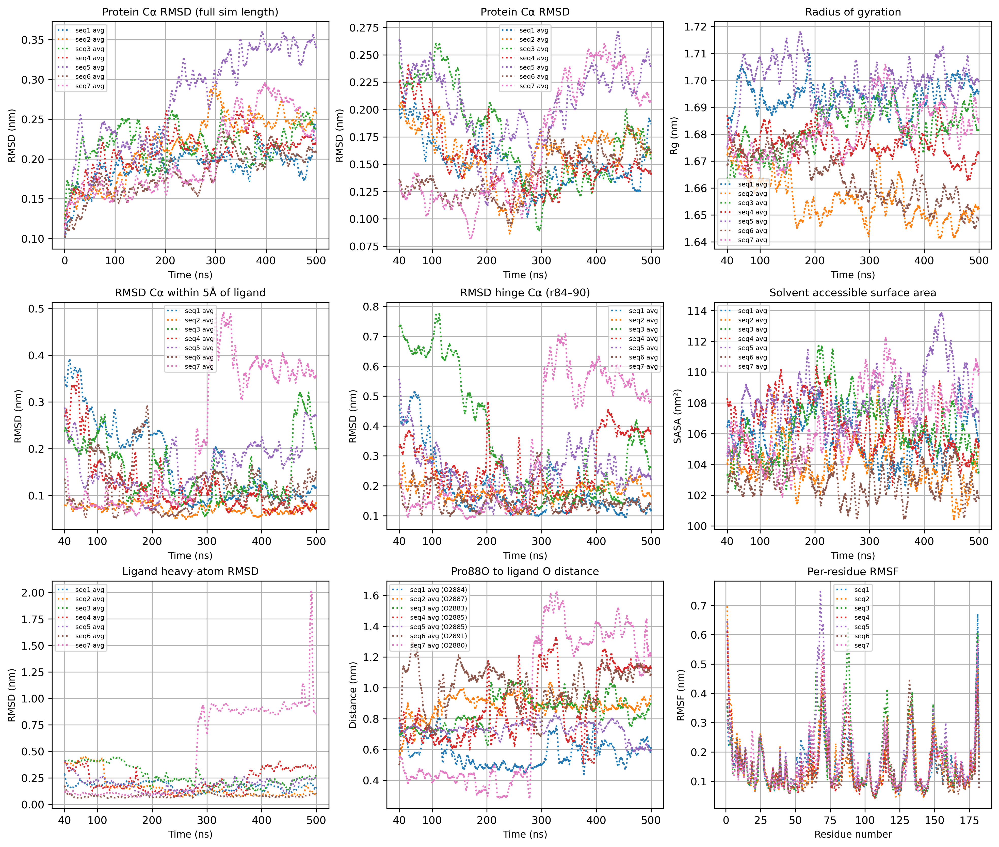

In [9]:
# ── Legacy nonbinders ───────────────────────────────────────────────────────
legacy_nb_ids = ["seq1", "seq2", "seq3", "seq4", "seq5", "seq6", "seq7"]
legacy_nb_medoid = [40012.500 + 174375, 40012.500 + 425250, 40012.500 + 258000,
                    40012.500 + 206250, 40012.500 + 162000, 40012.500 + 204000,
                    40012.500 + 131625]
legacy_O_nb = [["2882","2883","2884"],["2885","2886","2887"],["2881","2882","2883"],
               ["2883","2884","2885"],["2883","2884","2885"],["2889","2890","2891"],
               ["2878","2879","2880"]]

# ── Pair nonbinders ──────────────────────────────────────────────────────────
pair_nb_ids = [
    "0777","0827","1939","1824",
    "0052","0091","0246","0269","0272",
    "0276","0288","0341","0351","0450",
    "0502","0506","0549","0567","0584",
    "0602","0647","0684","0736","0748",
    "0765","0776","0782","0811","0822",
    "0865","0867","0868","0876","0878",
    "0883","0891","0908","0932","0940",
    "0974","0977","1011","1023","1102",
    "1313","1397","1654","1656","1658",
    "1671","1679","1709","1710","1737",
    "1758","1784","1785","1792","1835",
    "1847","1860","1914","1922","1938",
    "1961","1965"
]

seqnb_list = legacy_nb_ids + [f"pair_{i}_nb" for i in pair_nb_ids]
nb_folder_list = [f"{s}_nb" for s in legacy_nb_ids] + [f"pair_{i}_nb" for i in pair_nb_ids]
nb_medoid_time_list = legacy_nb_medoid + [40012.500] * len(pair_nb_ids)

ma_window = 130
base = "/Users/ivanatang/Library/CloudStorage/OneDrive-UCB-O365/Shirts Lab/LCA_boltz_models"
seq_type = "nonbinders"
runrel = "prod_md_0p9_cutoff_3dt_64x1_16PME_642dd"
xticks_ns = [40, 100, 200, 300, 400, 500]

n_nb = len(seqnb_list)
nonbinder_colors = plt.cm.Reds(np.linspace(0.35, 0.9, min(n_nb, 20)))

fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(13, 11), dpi=300, constrained_layout=True)
metrics_rows = []

for i, (seqnb, folder_name) in enumerate(zip(seqnb_list, nb_folder_list)):
    color = nonbinder_colors[i % len(nonbinder_colors)]
    nb_medoid_time = nb_medoid_time_list[i]


    rundir = os.path.join(base, seq_type, folder_name, runrel)
    if not os.path.isdir(rundir):
        print(f"WARNING: directory not found — {rundir}")
        continue

    # Discover Pro88O–LCA oxygen files dynamically
    _pro88_files = sorted(glob.glob(
        os.path.join(rundir, "Pro88O_to_LIGO*_dist.xvg")))
    O_index1 = re.search(r"Pro88O_to_LIGO(\d+)_dist", _pro88_files[0]).group(1) if len(_pro88_files) > 0 else None
    O_index2 = re.search(r"Pro88O_to_LIGO(\d+)_dist", _pro88_files[1]).group(1) if len(_pro88_files) > 1 else None
    O_index3 = re.search(r"Pro88O_to_LIGO(\d+)_dist", _pro88_files[2]).group(1) if len(_pro88_files) > 2 else None

    try:
        full_prot_CAnb_x, full_prot_CAnb_y = get_data(os.path.join(rundir, "rmsd_CA.xvg"))
        full_mean, full_sd, full_min, full_max = summary_stats(full_prot_CAnb_y)

        cropped_x, cropped_y = get_data(os.path.join(rundir, "rmsd_CA_to_medoid.xvg"))
        cropped_xm, cropped_ym = mask(cropped_x, cropped_y, nb_medoid_time)
        cropped_mean, cropped_sd, cropped_min, cropped_max = summary_stats(cropped_ym)

        lig_x, lig_y = get_data(os.path.join(rundir, "rmsd_lig_heavy.xvg"))
        lig_xm, lig_ym = mask(lig_x, lig_y, nb_medoid_time)
        lig_mean, lig_sd, lig_min, lig_max = summary_stats(lig_ym)

        hinge_x, hinge_y = get_data(os.path.join(rundir, "rmsd_CA_hinge.xvg"))
        hinge_xm, hinge_ym = mask(hinge_x, hinge_y, nb_medoid_time)
        hinge_mean, hinge_sd, hinge_min, hinge_max = summary_stats(hinge_ym)

        near_x, near_y = get_data(os.path.join(rundir, "rmsd_CA_near_LIG_5A.xvg"))
        near_xm, near_ym = mask(near_x, near_y, nb_medoid_time)
        near_mean, near_sd, near_min, near_max = summary_stats(near_ym)

        if O_index3 is not None:
            d3_x, d3_y = get_data(os.path.join(rundir, f"Pro88O_to_LIGO{O_index3}_dist.xvg"))
            d3_mean, d3_sd, d3_min, d3_max = summary_stats(d3_y)
        else:
            print(f"WARNING: no Pro88O dist files found in {rundir}")
            d3_x = d3_y = np.array([]); d3_mean = d3_sd = d3_min = d3_max = np.nan


        rg_x, rg_y   = get_data(os.path.join(rundir, "Rg_PL.xvg"))
        rg_xm, rg_ym = mask(rg_x, rg_y, nb_medoid_time)
        rg_mean, rg_sd, rg_min, rg_max = summary_stats(rg_ym)

        sasa_x, sasa_y   = get_data(os.path.join(rundir, "sasa_PL.xvg"))
        sasa_xm, sasa_ym = mask(sasa_x, sasa_y, nb_medoid_time)
        sasa_mean, sasa_sd, sasa_min, sasa_max = summary_stats(sasa_ym)

        rmsf_x, rmsf_y = get_data(os.path.join(rundir, "rmsf_PL.xvg"))

    except FileNotFoundError as e:
        print(f"WARNING: missing file for {seqnb}: {e}")
        continue

    full_prot_CAnb_y_ma = moving_average(full_prot_CAnb_y, window=ma_window)
    cropped_ym_ma       = moving_average(cropped_ym,       window=ma_window)
    lig_ym_ma           = moving_average(lig_ym,           window=ma_window)
    hinge_ym_ma         = moving_average(hinge_ym,         window=ma_window)
    near_ym_ma          = moving_average(near_ym,          window=ma_window)
    d3_y_ma = moving_average(d3_y, window=ma_window) if O_index3 is not None else np.array([])
    rg_ym_ma            = moving_average(rg_ym,            window=ma_window)
    sasa_ym_ma          = moving_average(sasa_ym,          window=ma_window)

    axs[0, 0].plot(full_prot_CAnb_x/1000, full_prot_CAnb_y_ma, ls=':', color=color, alpha=alpha_avg, label=seqnb)
    axs[0, 1].plot(cropped_xm/1000,       cropped_ym_ma,        ls=':', color=color, alpha=alpha_avg, label=seqnb)
    axs[1, 0].plot(near_xm/1000,          near_ym_ma,           ls=':', color=color, alpha=alpha_avg, label=seqnb)
    axs[1, 1].plot(hinge_xm/1000,         hinge_ym_ma,          ls=':', color=color, alpha=alpha_avg, label=seqnb)
    axs[2, 0].plot(lig_xm/1000,           lig_ym_ma,            ls=':', color=color, alpha=alpha_avg, label=seqnb)
    axs[2, 1].plot(d3_x/1000,             d3_y_ma,              ls=':', color=color, alpha=alpha_avg, label=seqnb)
    axs[0, 2].plot(rg_xm/1000,            rg_ym_ma,             ls=':', color=color, alpha=alpha_avg, label=seqnb)
    axs[1, 2].plot(sasa_xm/1000,          sasa_ym_ma,           ls=':', color=color, alpha=alpha_avg, label=seqnb)
    axs[2, 2].plot(rmsf_x, rmsf_y,        ls=':', color=color, alpha=alpha_avg, label=seqnb)

    metrics_rows.append({
        "Seq": seqnb,
        "Full frames": full_prot_CAnb_y.size, "Full mean": full_mean, "Full SD": full_sd,
        "Full min": full_min, "Full max": full_max,
        "Cropped frames": cropped_ym.size, "Cropped mean": cropped_mean, "Cropped SD": cropped_sd,
        "Cropped min": cropped_min, "Cropped max": cropped_max,
        "LIG heavy frames": lig_ym.size, "LIG heavy mean": lig_mean, "LIG heavy SD": lig_sd,
        "LIG heavy min": lig_min, "LIG heavy max": lig_max,
        "Hinge frames": hinge_ym.size, "Hinge mean": hinge_mean, "Hinge SD": hinge_sd,
        "Hinge min": hinge_min, "Hinge max": hinge_max,
        "Near-LIG frames": near_ym.size, "Near-LIG mean": near_mean, "Near-LIG SD": near_sd,
        "Near-LIG min": near_min, "Near-LIG max": near_max,
        **({"Pro88O-LIGO frames": d3_y.size,
            "Pro88O-LIGO mean": d3_mean, "Pro88O-LIGO SD": d3_sd,
            "Pro88O-LIGO min": d3_min,  "Pro88O-LIGO max": d3_max}
           if O_index3 is not None else {}),
        "Rg frames": rg_ym.size, "Rg mean": rg_mean, "Rg SD": rg_sd,
        "Rg min": rg_min, "Rg max": rg_max,
        "SASA frames": sasa_ym.size, "SASA mean": sasa_mean, "SASA SD": sasa_sd,
        "SASA min": sasa_min, "SASA max": sasa_max,
    })

axs[0, 0].set_title("Protein Cα RMSD (full sim length)", fontsize=title_fontsize)
axs[0, 0].set_xlabel("Time (ns)", fontsize=ax_fontsize); axs[0, 0].set_ylabel("RMSD (nm)", fontsize=ax_fontsize)
axs[0, 0].grid(True); axs[0, 0].legend(fontsize=legend_fontsize, ncol=2)

axs[0, 1].set_title("Protein Cα RMSD", fontsize=title_fontsize)
axs[0, 1].set_xlabel("Time (ns)", fontsize=ax_fontsize); axs[0, 1].set_ylabel("RMSD (nm)", fontsize=ax_fontsize)
axs[0, 1].set_xticks(xticks_ns); axs[0, 1].grid(True); axs[0, 1].legend(fontsize=legend_fontsize, ncol=2)

axs[1, 0].set_title("RMSD Cα within 5Å of ligand", fontsize=title_fontsize)
axs[1, 0].set_xlabel("Time (ns)", fontsize=ax_fontsize); axs[1, 0].set_ylabel("RMSD (nm)", fontsize=ax_fontsize)
axs[1, 0].set_xticks(xticks_ns); axs[1, 0].grid(True); axs[1, 0].legend(fontsize=legend_fontsize, ncol=2)

axs[1, 1].set_title("RMSD hinge Cα (r84–90)", fontsize=title_fontsize)
axs[1, 1].set_xlabel("Time (ns)", fontsize=ax_fontsize); axs[1, 1].set_ylabel("RMSD (nm)", fontsize=ax_fontsize)
axs[1, 1].set_xticks(xticks_ns); axs[1, 1].grid(True); axs[1, 1].legend(fontsize=legend_fontsize, ncol=2)

axs[2, 0].set_title("Ligand heavy-atom RMSD", fontsize=title_fontsize)
axs[2, 0].set_xlabel("Time (ns)", fontsize=ax_fontsize); axs[2, 0].set_ylabel("RMSD (nm)", fontsize=ax_fontsize)
axs[2, 0].set_xticks(xticks_ns); axs[2, 0].grid(True); axs[2, 0].legend(fontsize=legend_fontsize, ncol=2)

axs[2, 1].set_title("Pro88O to ligand O distance", fontsize=title_fontsize)
axs[2, 1].set_xlabel("Time (ns)", fontsize=ax_fontsize); axs[2, 1].set_ylabel("Distance (nm)", fontsize=ax_fontsize)
axs[2, 1].set_xticks(xticks_ns); axs[2, 1].grid(True); axs[2, 1].legend(fontsize=legend_fontsize, ncol=2)

axs[0, 2].set_title("Radius of gyration", fontsize=title_fontsize)
axs[0, 2].set_xlabel("Time (ns)", fontsize=ax_fontsize); axs[0, 2].set_ylabel("Rg (nm)", fontsize=ax_fontsize)
axs[0, 2].set_xticks(xticks_ns); axs[0, 2].grid(True); axs[0, 2].legend(fontsize=legend_fontsize, ncol=2)

axs[1, 2].set_title("Solvent accessible surface area", fontsize=title_fontsize)
axs[1, 2].set_xlabel("Time (ns)", fontsize=ax_fontsize); axs[1, 2].set_ylabel("SASA (nm²)", fontsize=ax_fontsize)
axs[1, 2].set_xticks(xticks_ns); axs[1, 2].grid(True); axs[1, 2].legend(fontsize=legend_fontsize, ncol=2)

axs[2, 2].set_title("Per-residue RMSF", fontsize=title_fontsize)
axs[2, 2].set_xlabel("Residue number", fontsize=ax_fontsize); axs[2, 2].set_ylabel("RMSF (nm)", fontsize=ax_fontsize)
axs[2, 2].grid(True); axs[2, 2].legend(fontsize=legend_fontsize, ncol=2)

metrics_df = pd.DataFrame(metrics_rows)
display(metrics_df)

# Save:
# fig.savefig(os.path.join(base, "analysis/nonbinders", "all_nonbinders_prod_analysis.png"), dpi=300, bbox_inches="tight")
# metrics_df.to_csv(os.path.join(base, "analysis/nonbinders", "all_nonbinders_summary_stats.csv"), index=False)

## Plot together to compare

NameError: name 'mask' is not defined

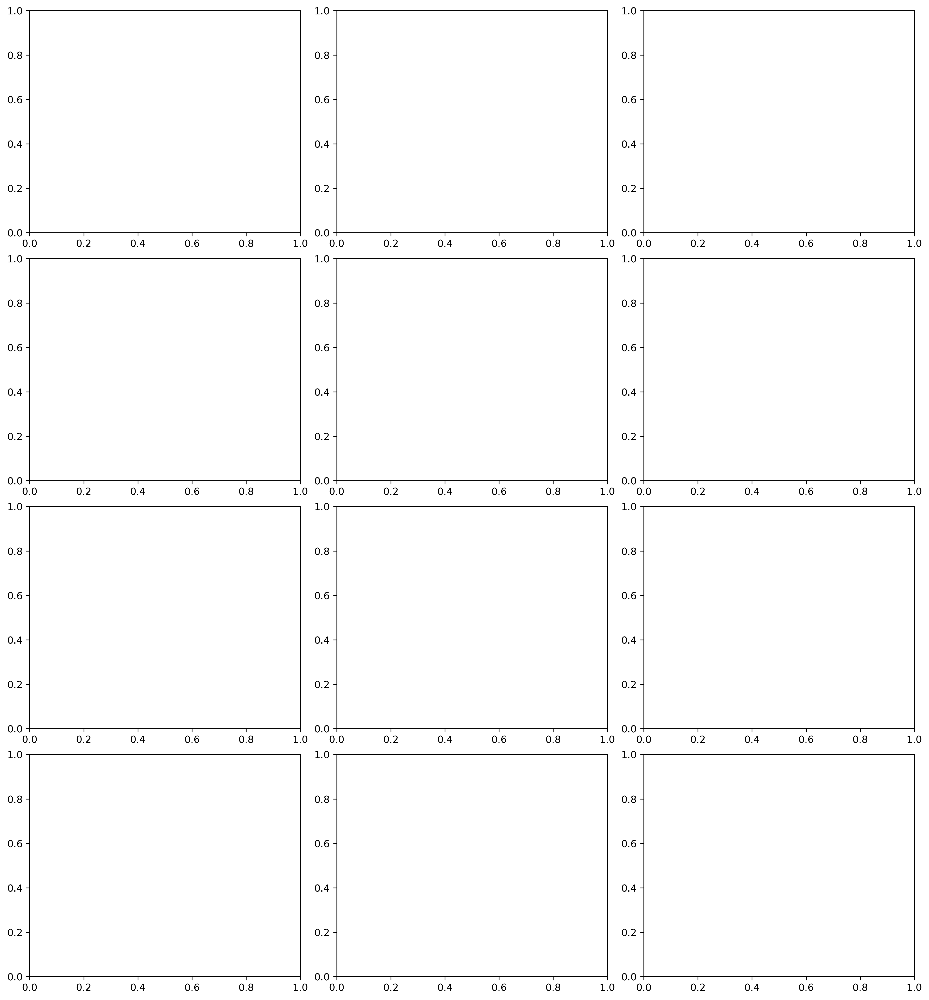

In [10]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

legend_fontsize = 6
title_fontsize  = 10
ax_fontsize     = 9
alpha_raw = 0.30
alpha_avg = 1

base   = "/Users/ivanatang/Library/CloudStorage/OneDrive-UCB-O365/Shirts Lab/LCA_boltz_models"
runrel = "prod_md_0p9_cutoff_3dt_64x1_16PME_642dd"
xticks_ns = [40, 100, 200, 300, 400, 500]
ma_window = 130

# ── All binders ───────────────────────────────────────────────────────────────
legacy_binder_ids = ['seq16', 'seq14', 'seq10', 'seq17', 'seq39', 'seq42']
legacy_b_medoid   = [40012.5+197625, 40012.5+294000, 40012.5+184125,
                     40012.5+252000, 40012.5+436500, 40012.5+401250]
legacy_O_b = [["2889","2890","2891"],["2893","2894","2895"],["2886","2887","2888"],
              ["2894","2895","2896"],["2888","2889","2890"],["2906","2907","2908"]]

pair_binder_ids = [
    "3069","3070","3074","3092","3098",
    "3062","3063","3066","3067",
    "3068","3071","3072","3073","3075",
    "3076","3077","3078","3079","3080",
    "3085","3086","3087","3088","3091",
    "3099","3100","3101","3103","3104","3108"
]

# ── All nonbinders ────────────────────────────────────────────────────────────
legacy_nb_ids    = ["seq1","seq2","seq3","seq4","seq5","seq6","seq7"]
legacy_nb_medoid = [40012.500+174375, 40012.500+425250, 40012.500+258000,
                    40012.500+206250, 40012.500+162000, 40012.500+204000,
                    40012.500+131625]
legacy_O_nb = [["2882","2883","2884"],["2885","2886","2887"],["2881","2882","2883"],
               ["2883","2884","2885"],["2883","2884","2885"],["2889","2890","2891"],
               ["2878","2879","2880"]]

pair_nb_ids = [
    "0777","0827","1939","1824",
    "0052","0091","0246","0269","0272",
    "0276","0288","0341","0351","0450",
    "0502","0506","0549","0567","0584",
    "0602","0647","0684","0736","0748",
    "0765","0776","0782","0811","0822",
    "0865","0867","0868","0876","0878",
    "0883","0891","0908","0932","0940",
    "0974","0977","1011","1023","1102",
    "1313","1397","1654","1656","1658",
    "1671","1679","1709","1710","1737",
    "1758","1784","1785","1792","1835",
    "1847","1860","1914","1922","1938",
    "1961","1965","3059"
]

# ── All neg_low_pkt ───────────────────────────────────────────────────────────
pair_low_pkt_ids = ["0008","0393","0482","1331","1931","0065","0947","0948","1413"]

# ── All neg_fail_gate ─────────────────────────────────────────────────────────
pair_fail_gate_ids = ["0715","1094","1682","1739","1941","0014","0263","0540","0997","1745"]

# ── Bundle into systems list ──────────────────────────────────────────────────
n_b  = len(legacy_binder_ids) + len(pair_binder_ids)
n_nb = len(legacy_nb_ids)     + len(pair_nb_ids)
n_lp = len(pair_low_pkt_ids)
n_fg = len(pair_fail_gate_ids)

binder_colors    = plt.cm.Blues(np.linspace(0.35, 0.9, min(n_b,  20)))
nonbinder_colors = plt.cm.Reds( np.linspace(0.35, 0.9, min(n_nb, 20)))
lowpkt_colors    = plt.cm.Oranges(np.linspace(0.4, 0.85, min(n_lp, 20)))
failgate_colors  = plt.cm.YlOrBr( np.linspace(0.4, 0.85, min(n_fg, 20)))

systems = []

for i, (seq, med) in enumerate(zip(legacy_binder_ids, legacy_b_medoid)):
    systems.append({"seq": seq, "type": "binders", "suffix": "binder",
                    "medoid_time": med,
                    "color": binder_colors[i % len(binder_colors)], "linestyle": "-"})

for i, pid in enumerate(pair_binder_ids):
    systems.append({"seq": f"pair_{pid}_binder", "type": "binders",
                    "suffix": "binder", "folder": f"pair_{pid}_binder",
                    "medoid_time": 40012.5,
                    "color": binder_colors[(len(legacy_binder_ids)+i) % len(binder_colors)],
                    "linestyle": "-"})

for i, (seq, med) in enumerate(zip(legacy_nb_ids, legacy_nb_medoid)):
    systems.append({"seq": seq, "type": "nonbinders", "suffix": "nb",
                    "medoid_time": med,
                    "color": nonbinder_colors[i % len(nonbinder_colors)], "linestyle": "--"})

for i, pid in enumerate(pair_nb_ids):
    systems.append({"seq": f"pair_{pid}_nb", "type": "nonbinders",
                    "suffix": "nb", "folder": f"pair_{pid}_nb",
                    "medoid_time": 40012.5,
                    "color": nonbinder_colors[(len(legacy_nb_ids)+i) % len(nonbinder_colors)],
                    "linestyle": "--"})

for i, pid in enumerate(pair_low_pkt_ids):
    systems.append({"seq": f"pair_{pid}_low_pkt", "type": "neg_low_pkt",
                    "suffix": "low_pkt", "folder": f"pair_{pid}_low_pkt",
                    "medoid_time": 40012.5,
                    "color": lowpkt_colors[i % len(lowpkt_colors)], "linestyle": ":"})

for i, pid in enumerate(pair_fail_gate_ids):
    systems.append({"seq": f"pair_{pid}_fail_gate", "type": "neg_fail_gate",
                    "suffix": "fail_gate", "folder": f"pair_{pid}_fail_gate",
                    "medoid_time": 40012.5,
                    "color": failgate_colors[i % len(failgate_colors)],
                    "linestyle": (0, (3, 1, 1, 1))})

# ── Plot ──────────────────────────────────────────────────────────────────────
fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(13, 14), dpi=300, constrained_layout=True)
metrics_rows = []

for sys in systems:
    seq         = sys["seq"]
    seq_type    = sys["type"]
    suffix      = sys["suffix"]
    medoid_time = sys["medoid_time"]

    color       = sys["color"]
    ls          = sys["linestyle"]
    folder_name = sys.get("folder", f"{seq}_{suffix}")

    group_label = {"binders": "binder", "nonbinders": "nonbinder",
                   "neg_low_pkt": "low_pkt", "neg_fail_gate": "fail_gate"}.get(seq_type, seq_type)
    label_base = f"{seq} ({group_label})"

    rundir = os.path.join(base, seq_type, folder_name, runrel)
    if not os.path.isdir(rundir):
        print(f"WARNING: not found — {rundir}")
        continue

    # Discover Pro88O–LCA oxygen files dynamically
    _pro88_files = sorted(glob.glob(
        os.path.join(rundir, "Pro88O_to_LIGO*_dist.xvg")))
    O1 = re.search(r"Pro88O_to_LIGO(\d+)_dist", _pro88_files[0]).group(1) if len(_pro88_files) > 0 else None
    O2 = re.search(r"Pro88O_to_LIGO(\d+)_dist", _pro88_files[1]).group(1) if len(_pro88_files) > 1 else None
    O3 = re.search(r"Pro88O_to_LIGO(\d+)_dist", _pro88_files[2]).group(1) if len(_pro88_files) > 2 else None

    try:
        full_x, full_y = get_data(os.path.join(rundir, "rmsd_CA.xvg"))
        full_mean, full_sd, full_min, full_max = summary_stats(full_y)

        cropped_x, cropped_y = get_data(os.path.join(rundir, "rmsd_CA_to_medoid.xvg"))
        cropped_xm, cropped_ym = mask(cropped_x, cropped_y, medoid_time)
        cropped_mean, cropped_sd, cropped_min, cropped_max = summary_stats(cropped_ym)

        lig_x, lig_y = get_data(os.path.join(rundir, "rmsd_lig_heavy.xvg"))
        lig_xm, lig_ym = mask(lig_x, lig_y, medoid_time)
        lig_mean, lig_sd, lig_min, lig_max = summary_stats(lig_ym)

        hinge_x, hinge_y = get_data(os.path.join(rundir, "rmsd_CA_hinge.xvg"))
        hinge_xm, hinge_ym = mask(hinge_x, hinge_y, medoid_time)
        hinge_mean, hinge_sd, hinge_min, hinge_max = summary_stats(hinge_ym)

        near_x, near_y = get_data(os.path.join(rundir, "rmsd_CA_near_LIG_5A.xvg"))
        near_xm, near_ym = mask(near_x, near_y, medoid_time)
        near_mean, near_sd, near_min, near_max = summary_stats(near_ym)

        if O3 is not None:
            d3_x, d3_y = get_data(os.path.join(rundir, f"Pro88O_to_LIGO{O3}_dist.xvg"))
            d3_mean, d3_sd, d3_min, d3_max = summary_stats(d3_y)
        else:
            print(f"WARNING: no Pro88O dist files found in {rundir}")
            d3_x = d3_y = np.array([]); d3_mean = d3_sd = d3_min = d3_max = np.nan


        rg_x, rg_y   = get_data(os.path.join(rundir, "Rg_PL.xvg"))
        rg_xm, rg_ym = mask(rg_x, rg_y, medoid_time)
        rg_mean, rg_sd, rg_min, rg_max = summary_stats(rg_ym)

        sasa_x, sasa_y   = get_data(os.path.join(rundir, "sasa_PL.xvg"))
        sasa_xm, sasa_ym = mask(sasa_x, sasa_y, medoid_time)
        sasa_mean, sasa_sd, sasa_min, sasa_max = summary_stats(sasa_ym)

        rmsf_x, rmsf_y = get_data(os.path.join(rundir, "rmsf_PL.xvg"))
        rmsf_lig_x, rmsf_lig_y = get_data(os.path.join(rundir, "rmsf_LIG_peratom.xvg"))

    except FileNotFoundError as e:
        print(f"WARNING: missing file for {seq}: {e}")
        continue

    full_prot_ma  = moving_average(full_y,     window=ma_window)
    cropped_ym_ma = moving_average(cropped_ym, window=ma_window)
    lig_ym_ma     = moving_average(lig_ym,     window=ma_window)
    hinge_ym_ma   = moving_average(hinge_ym,   window=ma_window)
    near_ym_ma    = moving_average(near_ym,    window=ma_window)
    d3_y_ma = moving_average(d3_y, window=ma_window) if O3 is not None else np.array([])
    rg_ym_ma      = moving_average(rg_ym,      window=ma_window)
    sasa_ym_ma    = moving_average(sasa_ym,    window=ma_window)

    axs[0, 0].plot(full_x/1000,     full_prot_ma,  color=color, linestyle=ls, alpha=alpha_avg, label=label_base)
    axs[0, 1].plot(cropped_xm/1000, cropped_ym_ma, color=color, linestyle=ls, alpha=alpha_avg, label=label_base)
    axs[0, 2].plot(rg_xm/1000,      rg_ym_ma,      color=color, linestyle=ls, alpha=alpha_avg, label=label_base)
    axs[1, 0].plot(near_xm/1000,    near_ym_ma,    color=color, linestyle=ls, alpha=alpha_avg, label=label_base)
    axs[1, 1].plot(hinge_xm/1000,   hinge_ym_ma,   color=color, linestyle=ls, alpha=alpha_avg, label=label_base)
    axs[1, 2].plot(sasa_xm/1000,    sasa_ym_ma,    color=color, linestyle=ls, alpha=alpha_avg, label=label_base)
    axs[2, 0].plot(lig_xm/1000,     lig_ym_ma,     color=color, linestyle=ls, alpha=alpha_avg, label=label_base)
    if O3 is not None:
        axs[2, 1].plot(d3_x/1000,       d3_y_ma,       color=color, linestyle=ls, alpha=alpha_avg, label=f"{label_base} (O{O3})")
    axs[2, 2].plot(rmsf_x,          rmsf_y,        color=color, linestyle=ls, alpha=alpha_avg, label=label_base)
    rmsf_lig_x_norm = rmsf_lig_x - rmsf_lig_x[0]
    axs[3, 1].plot(rmsf_lig_x_norm, rmsf_lig_y, color=color, linestyle=ls, alpha=alpha_avg, label=label_base)

    metrics_rows.append({
        "Seq": seq, "Type": group_label,
        "Full frames": full_y.size, "Full mean": full_mean, "Full SD": full_sd,
        "Full min": full_min, "Full max": full_max,
        "Cropped frames": cropped_ym.size, "Cropped mean": cropped_mean, "Cropped SD": cropped_sd,
        "Cropped min": cropped_min, "Cropped max": cropped_max,
        "LIG heavy frames": lig_ym.size, "LIG heavy mean": lig_mean, "LIG heavy SD": lig_sd,
        "LIG heavy min": lig_min, "LIG heavy max": lig_max,
        "Hinge frames": hinge_ym.size, "Hinge mean": hinge_mean, "Hinge SD": hinge_sd,
        "Hinge min": hinge_min, "Hinge max": hinge_max,
        "Near-LIG frames": near_ym.size, "Near-LIG mean": near_mean, "Near-LIG SD": near_sd,
        "Near-LIG min": near_min, "Near-LIG max": near_max,
        **({"Pro88O-LIGO frames": d3_y.size,
            "Pro88O-LIGO mean": d3_mean, "Pro88O-LIGO SD": d3_sd,
            "Pro88O-LIGO min": d3_min,  "Pro88O-LIGO max": d3_max}
           if O3 is not None else {}),
        "Rg frames": rg_ym.size, "Rg mean": rg_mean, "Rg SD": rg_sd,
        "Rg min": rg_min, "Rg max": rg_max,
        "SASA frames": sasa_ym.size, "SASA mean": sasa_mean, "SASA SD": sasa_sd,
        "SASA min": sasa_min, "SASA max": sasa_max,
    })

# ── Axis formatting ───────────────────────────────────────────────────────────
axs[0, 0].set_title("Protein Cα RMSD (full sim length)", fontsize=title_fontsize)
axs[0, 0].set_xlabel("Time (ns)", fontsize=ax_fontsize); axs[0, 0].set_ylabel("RMSD (nm)", fontsize=ax_fontsize)
axs[0, 0].grid(True); axs[0, 0].legend(fontsize=legend_fontsize, ncol=2)

axs[0, 1].set_title("Protein Cα RMSD (to medoid)", fontsize=title_fontsize)
axs[0, 1].set_xlabel("Time (ns)", fontsize=ax_fontsize); axs[0, 1].set_ylabel("RMSD (nm)", fontsize=ax_fontsize)
axs[0, 1].set_xticks(xticks_ns); axs[0, 1].grid(True); axs[0, 1].legend(fontsize=legend_fontsize, ncol=2)

axs[0, 2].set_title("Radius of gyration", fontsize=title_fontsize)
axs[0, 2].set_xlabel("Time (ns)", fontsize=ax_fontsize); axs[0, 2].set_ylabel("Rg (nm)", fontsize=ax_fontsize)
axs[0, 2].set_xticks(xticks_ns); axs[0, 2].grid(True); axs[0, 2].legend(fontsize=legend_fontsize, ncol=2)

axs[1, 0].set_title("RMSD Cα within 5Å of ligand", fontsize=title_fontsize)
axs[1, 0].set_xlabel("Time (ns)", fontsize=ax_fontsize); axs[1, 0].set_ylabel("RMSD (nm)", fontsize=ax_fontsize)
axs[1, 0].set_xticks(xticks_ns); axs[1, 0].grid(True); axs[1, 0].legend(fontsize=legend_fontsize, ncol=2)

axs[1, 1].set_title("RMSD hinge Cα (r84–90)", fontsize=title_fontsize)
axs[1, 1].set_xlabel("Time (ns)", fontsize=ax_fontsize); axs[1, 1].set_ylabel("RMSD (nm)", fontsize=ax_fontsize)
axs[1, 1].set_xticks(xticks_ns); axs[1, 1].grid(True); axs[1, 1].legend(fontsize=legend_fontsize, ncol=2)

axs[1, 2].set_title("Solvent accessible surface area", fontsize=title_fontsize)
axs[1, 2].set_xlabel("Time (ns)", fontsize=ax_fontsize); axs[1, 2].set_ylabel("SASA (nm²)", fontsize=ax_fontsize)
axs[1, 2].set_xticks(xticks_ns); axs[1, 2].grid(True); axs[1, 2].legend(fontsize=legend_fontsize, ncol=2)

axs[2, 0].set_title("Ligand heavy-atom RMSD", fontsize=title_fontsize)
axs[2, 0].set_xlabel("Time (ns)", fontsize=ax_fontsize); axs[2, 0].set_ylabel("RMSD (nm)", fontsize=ax_fontsize)
axs[2, 0].set_xticks(xticks_ns); axs[2, 0].grid(True); axs[2, 0].legend(fontsize=legend_fontsize, ncol=2)

axs[2, 1].set_title("Pro88O to ligand O distance", fontsize=title_fontsize)
axs[2, 1].set_xlabel("Time (ns)", fontsize=ax_fontsize); axs[2, 1].set_ylabel("Distance (nm)", fontsize=ax_fontsize)
axs[2, 1].set_xticks(xticks_ns); axs[2, 1].grid(True); axs[2, 1].legend(fontsize=legend_fontsize, ncol=2)

axs[2, 2].set_title("Per-residue RMSF", fontsize=title_fontsize)
axs[2, 2].set_xlabel("Residue number", fontsize=ax_fontsize); axs[2, 2].set_ylabel("RMSF (nm)", fontsize=ax_fontsize)
axs[2, 2].grid(True); axs[2, 2].legend(fontsize=legend_fontsize, ncol=2)
axs[2, 2].axvspan(84,  90,  color='grey', alpha=0.5, zorder=0, label='Gate (84–90)')
axs[2, 2].axvspan(114, 118, color='grey', alpha=0.5, zorder=0, label='Latch (114–118)')

axs[3, 1].set_title("Ligand heavy-atom RMSF", fontsize=title_fontsize)
axs[3, 1].set_xlabel("Atom index", fontsize=ax_fontsize); axs[3, 1].set_ylabel("RMSF (nm)", fontsize=ax_fontsize)
axs[3, 1].grid(True); axs[3, 1].legend(fontsize=legend_fontsize, ncol=2)
axs[3, 0].set_visible(False); axs[3, 2].set_visible(False)

metrics_df = pd.DataFrame(metrics_rows)
display(metrics_df)

# Save:
# fig.savefig(os.path.join(base, "analysis", "all_sequences_prod_analysis.png"), dpi=300, bbox_inches="tight")
# metrics_df.to_csv(os.path.join(base, "analysis", "all_sequences_summary_stats.csv"), index=False)

In [11]:
# ------------------------------------------------------------
# Average SASA comparison: binders vs nonbinders
# ------------------------------------------------------------

# Collect masked SASA traces for each group
binder_sasa_traces    = []
nonbinder_sasa_traces = []

for sys in systems:
    seq         = sys["seq"]
    seq_type    = sys["type"]
    suffix      = sys["suffix"]
    medoid_time = sys["medoid_time"]

    rundir = os.path.join(base, seq_type, f"{seq}_{suffix}", runrel)
    sasa_x, sasa_y   = get_data(os.path.join(rundir, "sasa_PL.xvg"))
    sasa_xm, sasa_ym = mask(sasa_x, sasa_y, medoid_time)

    if seq_type == "binders":
        binder_sasa_traces.append((sasa_xm, sasa_ym))
    else:
        nonbinder_sasa_traces.append((sasa_xm, sasa_ym))

def interpolate_to_common_grid(traces):
    """Interpolates (x, y) traces onto a shared time grid.

    The grid spans from the latest start time to the earliest end time
    across all traces, so every trace has data across the full grid.

    Args:
        traces (list[tuple[numpy.ndarray, numpy.ndarray]]): (x, y) pairs.

    Returns:
        tuple[numpy.ndarray, numpy.ndarray, numpy.ndarray]: (grid, mean,
        std), each aligned to the shared grid.
    """
    t_start = max(x[0]  for x, y in traces)
    t_end   = min(x[-1] for x, y in traces)
    t_grid  = np.linspace(t_start, t_end, 5000)

    interpolated = np.array([
        np.interp(t_grid, x, y) for x, y in traces
    ])
    return t_grid, interpolated.mean(axis=0), interpolated.std(axis=0)

b_grid,  b_mean,  b_std  = interpolate_to_common_grid(binder_sasa_traces)
nb_grid, nb_mean, nb_std = interpolate_to_common_grid(nonbinder_sasa_traces)

# --- plot ---
fig_sasa, ax_sasa = plt.subplots(figsize=(8, 4), dpi=300, constrained_layout=True)

# Binders
ax_sasa.plot(b_grid/1000,  b_mean,  color='steelblue', label='Binders (mean)')
ax_sasa.fill_between(b_grid/1000,  b_mean  - b_std,  b_mean  + b_std,
                     color='steelblue', alpha=0.25, label='Binders (±1 SD)')

# Nonbinders
ax_sasa.plot(nb_grid/1000, nb_mean, color='firebrick', label='Nonbinders (mean)')
ax_sasa.fill_between(nb_grid/1000, nb_mean - nb_std, nb_mean + nb_std,
                     color='firebrick', alpha=0.25, label='Nonbinders (±1 SD)')

ax_sasa.set_title("Mean SASA: binders vs nonbinders", fontsize=title_fontsize)
ax_sasa.set_xlabel("Time (ns)", fontsize=ax_fontsize)
ax_sasa.set_ylabel("SASA (nm²)", fontsize=ax_fontsize)
ax_sasa.set_xticks(xticks_ns)
ax_sasa.grid(True)
ax_sasa.legend(fontsize=legend_fontsize)

# Optional save:
# fig_sasa.savefig(os.path.join(base, "analysis", "sasa_binders_vs_nonbinders_mean.png"), dpi=300, bbox_inches="tight")

NameError: name 'mask' is not defined

## Radius of gyration: pocket vs whole protein

In [22]:
# Radius of gyration: pocket vs whole-protein comparison. Reuses
# `systems`, `get_data`, and `mask` from the cells above.
#
# Newer-pipeline runs (pair_XXXX) write Rg_PL.xvg (whole protein) and
# Rg_pocket.xvg (27 consensus pocket residues, Leonard et al. 2024) under
# runrel/500ns/; legacy seqXX runs only have Rg_PL.xvg directly in
# runrel/ and predate the pocket calculation, so they're skipped for the
# pocket side of the comparison.

SUBDIR_TO_GROUP = {
    "binders": "Binder",
    "nonbinders": "False Positive",
    "neg_low_pkt": "Low Confidence",
    "neg_fail_gate": "Fail Geometry",
}

def rg_run_dir(base_rundir):
    """Resolves a sequence's Rg output directory, old or new pipeline layout.

    Args:
        base_rundir (str): Sequence's production run directory.

    Returns:
        str: `base_rundir`/500ns if that subdirectory has Rg_PL.xvg
        (newer pipeline), else `base_rundir` (legacy layout).
    """
    nested = os.path.join(base_rundir, "500ns")
    if os.path.exists(os.path.join(nested, "Rg_PL.xvg")):
        return nested
    return base_rundir

rg_rows = []
for sys in systems:
    seq         = sys["seq"]
    seq_type    = sys["type"]
    suffix      = sys["suffix"]
    medoid_time = sys["medoid_time"]
    folder_name = sys.get("folder", f"{seq}_{suffix}")
    group_label = SUBDIR_TO_GROUP.get(seq_type, seq_type)

    base_rundir = os.path.join(base, seq_type, folder_name, runrel)
    rundir = rg_run_dir(base_rundir)

    whole_path  = os.path.join(rundir, "Rg_PL.xvg")
    pocket_path = os.path.join(rundir, "Rg_pocket.xvg")

    if not os.path.exists(whole_path):
        print(f"WARNING: no whole-protein Rg for {seq} — skipping")
        continue

    whole_x, whole_y = get_data(whole_path)
    _, whole_ym = mask(whole_x, whole_y, medoid_time)

    pocket_mean = np.nan
    if os.path.exists(pocket_path):
        pocket_x, pocket_y = get_data(pocket_path)
        _, pocket_ym = mask(pocket_x, pocket_y, medoid_time)
        pocket_mean = pocket_ym.mean()
    else:
        print(f"  (no pocket Rg yet for {seq})")

    rg_rows.append({
        "Seq": seq, "Group": group_label,
        "Rg_whole_mean": whole_ym.mean(),
        "Rg_pocket_mean": pocket_mean,
    })

rg_compare_df = pd.DataFrame(rg_rows)
display(rg_compare_df)

  (no pocket Rg yet for pair_3059_binder)


,Seq,Group,Rg_whole_mean,Rg_pocket_mean
0,seq16,Binder,1.666760,0.932333
1,seq14,Binder,1.672168,0.953421
2,seq10,Binder,1.669331,0.947606
3,seq17,Binder,1.668521,0.923264
4,seq39,Binder,1.666041,0.955995
...,...,...,...,...
124,pair_0014_fail_gate,Fail Geometry,1.673315,0.982948
125,pair_0263_fail_gate,Fail Geometry,1.672085,0.948112
126,pair_0540_fail_gate,Fail Geometry,1.661720,0.981470
127,pair_0997_fail_gate,Fail Geometry,1.664953,1.003278


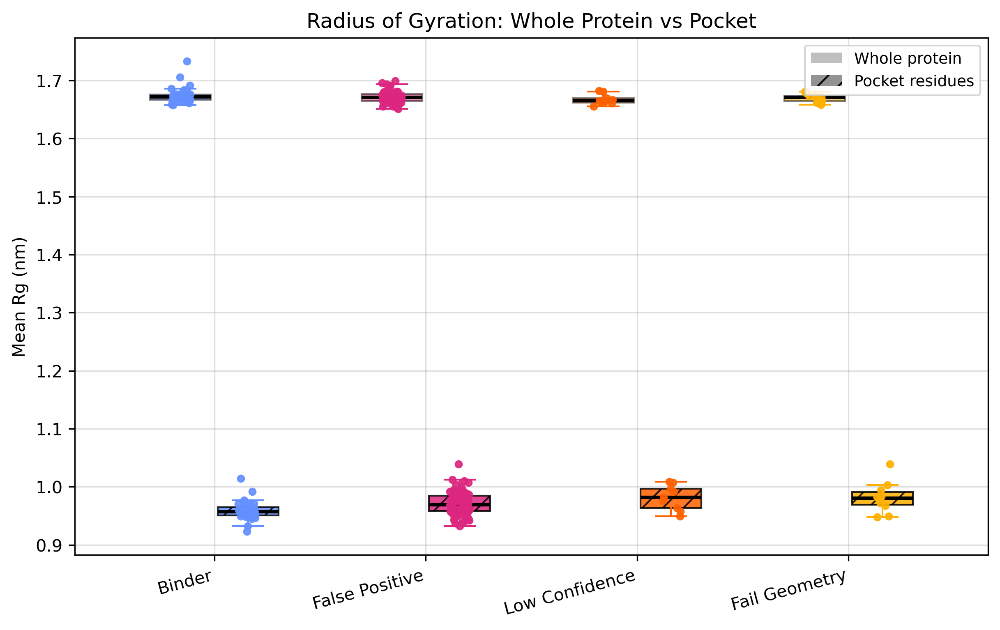

In [23]:
# ------------------------------------------------------------
# Plot: pocket vs whole-protein Rg by group
# ------------------------------------------------------------
GROUP_COLOR = {
    "Binder":         "#648FFF",
    "False Positive": "#DC267F",
    "Low Confidence": "#FE6100",
    "Fail Geometry":  "#FFB000",
}
GROUP_ORDER = ["Binder", "False Positive", "Low Confidence", "Fail Geometry"]

groups_present = [g for g in GROUP_ORDER if g in rg_compare_df["Group"].unique()]

fig, ax = plt.subplots(figsize=(8, 5), dpi=300, constrained_layout=True)
width = 0.32
rng = np.random.default_rng(42)

for i, group in enumerate(groups_present):
    sub = rg_compare_df[rg_compare_df["Group"] == group]
    color = GROUP_COLOR[group]

    whole_vals  = sub["Rg_whole_mean"].dropna().values
    pocket_vals = sub["Rg_pocket_mean"].dropna().values

    for offset, vals, alpha, hatch in [(-width / 2, whole_vals, 0.5, None),
                                        (width / 2, pocket_vals, 0.85, "//")]:
        if vals.size == 0:
            continue
        ax.boxplot(
            vals, positions=[i + offset], widths=width * 0.9,
            patch_artist=True,
            medianprops=dict(color="black", linewidth=2),
            boxprops=dict(facecolor=color, alpha=alpha, hatch=hatch),
            whiskerprops=dict(color=color),
            capprops=dict(color=color),
            flierprops=dict(marker="", linestyle="none"),
        )
        jitter = rng.uniform(-width * 0.15, width * 0.15, len(vals))
        ax.scatter(i + offset + jitter, vals, color=color, alpha=0.9, s=14, zorder=3)

ax.set_xticks(range(len(groups_present)))
ax.set_xticklabels(groups_present, rotation=15, ha="right")
ax.set_ylabel("Mean Rg (nm)")
ax.set_title("Radius of Gyration: Whole Protein vs Pocket")
ax.grid(True, alpha=0.4)

legend_patches = [
    Patch(facecolor="grey", alpha=0.5, label="Whole protein"),
    Patch(facecolor="grey", alpha=0.85, hatch="//", label="Pocket residues"),
]
ax.legend(handles=legend_patches, loc="upper right", fontsize=9)

os.makedirs("analysis/Rg", exist_ok=True)
fig.savefig("analysis/Rg/Rg_pocket_vs_whole_comparison.png")
plt.show()


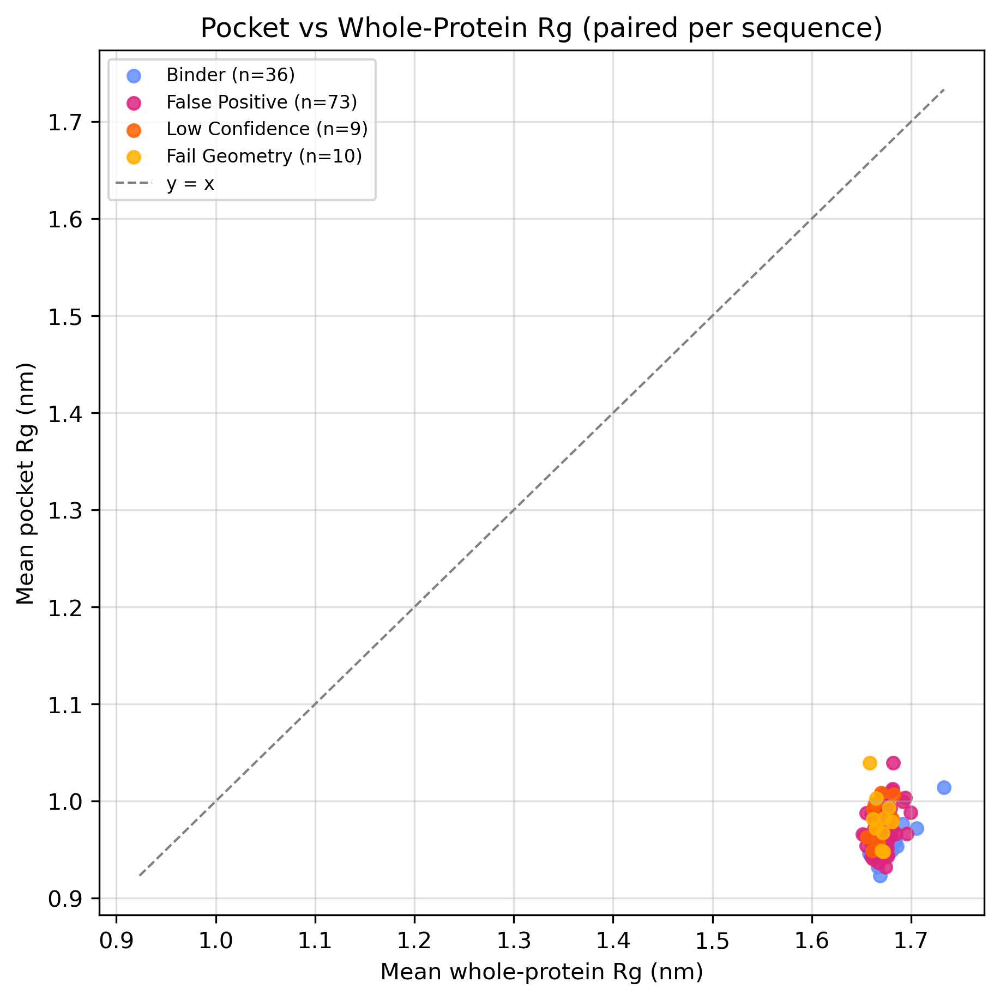

In [24]:
# ------------------------------------------------------------
# Plot: per-sequence pocket Rg vs whole-protein Rg (paired)
# ------------------------------------------------------------
fig2, ax2 = plt.subplots(figsize=(6, 6), dpi=300, constrained_layout=True)

paired_df = rg_compare_df.dropna(subset=["Rg_pocket_mean"])

for group in groups_present:
    sub = paired_df[paired_df["Group"] == group]
    if sub.empty:
        continue
    ax2.scatter(sub["Rg_whole_mean"], sub["Rg_pocket_mean"],
                color=GROUP_COLOR[group], alpha=0.85, s=30,
                label=f"{group} (n={len(sub)})")

if not paired_df.empty:
    lo = min(paired_df["Rg_whole_mean"].min(), paired_df["Rg_pocket_mean"].min())
    hi = max(paired_df["Rg_whole_mean"].max(), paired_df["Rg_pocket_mean"].max())
    ax2.plot([lo, hi], [lo, hi], color="grey", linestyle="--", linewidth=1, label="y = x")

ax2.set_xlabel("Mean whole-protein Rg (nm)")
ax2.set_ylabel("Mean pocket Rg (nm)")
ax2.set_title("Pocket vs Whole-Protein Rg (paired per sequence)")
ax2.grid(True, alpha=0.4)
ax2.legend(fontsize=8)

os.makedirs("analysis/Rg", exist_ok=True)
fig2.savefig("analysis/Rg/Rg_pocket_vs_whole_scatter.png")
plt.show()


Sequence   Group            Cis%   Trans%   Other%   Frames
----------------------------------------------------------
seq16      binder           0.0%   100.0%     0.0%    12267
seq14      binder           0.0%    99.9%     0.1%    12267
seq10      binder           0.0%   100.0%     0.0%    12267
seq17      binder           0.0%   100.0%     0.0%    12267
seq39      binder           0.0%    99.9%     0.1%    12267
seq42      binder           0.0%    99.9%     0.1%    12267
seq1       nonbinder        0.0%    99.7%     0.3%    12267
seq2       nonbinder        0.0%    99.9%     0.1%    12267
seq3       nonbinder        0.0%    99.5%     0.5%    12267
seq4       nonbinder        0.0%    99.9%     0.1%    12267
seq5       nonbinder        0.0%    99.8%     0.2%    12267
seq6       nonbinder        0.0%    99.8%     0.2%    12267
seq7       nonbinder        0.0%    99.4%     0.6%    12267


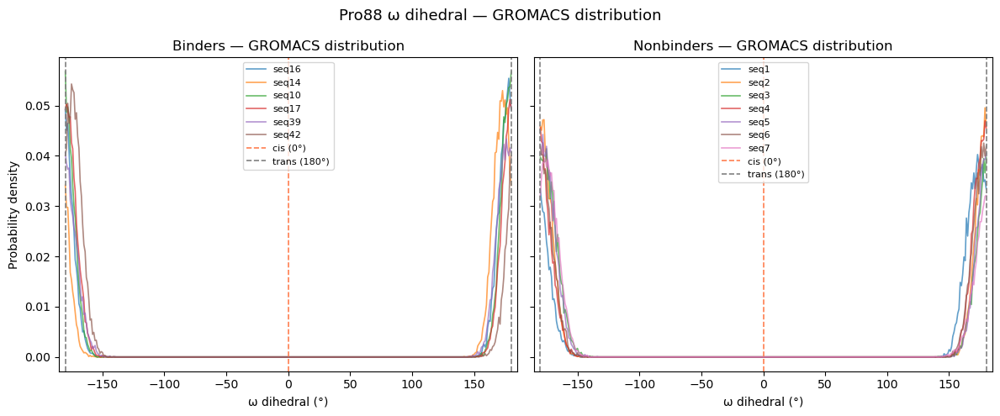

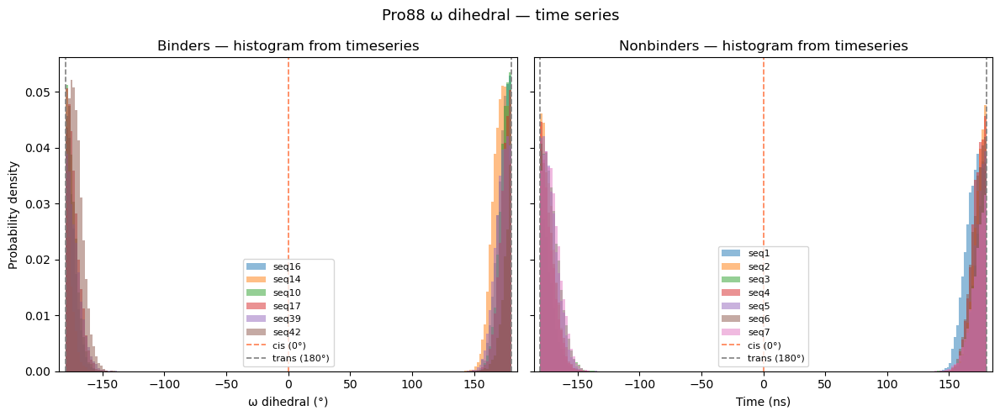

In [22]:
import os
import numpy as np
import matplotlib.pyplot as plt

base   = "/Users/ivanatang/Library/CloudStorage/OneDrive-UCB-O365/Shirts Lab/LCA_boltz_models"
runrel = "prod_md_0p9_cutoff_3dt_64x1_16PME_642dd"

binder_seqs    = [("seq16", "binders", "binder"), ("seq14", "binders", "binder"),
                  ("seq10", "binders", "binder"), ("seq17", "binders", "binder"),
                  ("seq39", "binders", "binder"), ("seq42", "binders", "binder")]
nonbinder_seqs = [("seq1",  "nonbinders", "nb"), ("seq2",  "nonbinders", "nb"),
                  ("seq3",  "nonbinders", "nb"), ("seq4",  "nonbinders", "nb"),
                  ("seq5",  "nonbinders", "nb"), ("seq6",  "nonbinders", "nb"),
                  ("seq7",  "nonbinders", "nb")]

def load_omega_timeseries(seq_list, fname="omega_pro88_timeseries.xvg"):
    """Loads Pro88 omega-dihedral timeseries for a list of sequences.

    Args:
        seq_list (list[tuple[str, str, str]]): (seq, seq_type, suffix)
            tuples, e.g. ("seq16", "binders", "binder").
        fname (str): Timeseries .xvg filename to load per sequence
            (default: "omega_pro88_timeseries.xvg").

    Returns:
        dict[str, tuple[numpy.ndarray, numpy.ndarray]]: Maps seq to
        (time_ps, omega_degrees) arrays. Sequences with a missing file
        are skipped with a printed warning.
    """
    group = {}
    for seq, seq_type, suffix in seq_list:
        filepath = os.path.join(base, seq_type, f"{seq}_{suffix}", runrel, fname)
        if not os.path.exists(filepath):
            print(f"WARNING: not found — {filepath}")
            continue
        time_ps, omega = [], []
        with open(filepath) as f:
            for line in f:
                line = line.strip()
                if line.startswith('#') or line.startswith('@') or not line:
                    continue
                parts = line.split()
                if len(parts) == 2:
                    try:
                        time_ps.append(float(parts[0]))
                        omega.append(float(parts[1]))
                    except ValueError:
                        continue
        group[seq] = (np.array(time_ps), np.array(omega))
    return group

def load_omega_distribution(seq_list, fname="omega_pro88_distribution.xvg"):
    """Loads GROMACS-computed Pro88 omega-dihedral distributions.

    Args:
        seq_list (list[tuple[str, str, str]]): (seq, seq_type, suffix)
            tuples, e.g. ("seq16", "binders", "binder").
        fname (str): Distribution .xvg filename to load per sequence
            (default: "omega_pro88_distribution.xvg").

    Returns:
        dict[str, tuple[numpy.ndarray, numpy.ndarray]]: Maps seq to
        (angle_degrees, probability_density) arrays. Sequences with a
        missing file are skipped with a printed warning.
    """
    group = {}
    for seq, seq_type, suffix in seq_list:
        filepath = os.path.join(base, seq_type, f"{seq}_{suffix}", runrel, fname)
        if not os.path.exists(filepath):
            print(f"WARNING: not found — {filepath}")
            continue
        angles, prob = [], []
        with open(filepath) as f:
            for line in f:
                line = line.strip()
                if line.startswith('#') or line.startswith('@') or not line:
                    continue
                parts = line.split()
                if len(parts) == 2:
                    try:
                        angles.append(float(parts[0]))
                        prob.append(float(parts[1]))
                    except ValueError:
                        continue
        group[seq] = (np.array(angles), np.array(prob))
    return group

def get_populations(omega):
    """Classifies an omega-dihedral timeseries into cis/trans/other populations.

    Cis is defined as |omega| < 30 deg, trans as |omega| > 150 deg, and
    everything between is "other".

    Args:
        omega: Array-like of omega dihedral values in degrees.

    Returns:
        dict: cis_frac, trans_frac, other_frac (population fractions) and
        n_frames (total frame count).
    """
    cis_mask   = np.abs(omega) < 30
    trans_mask = np.abs(omega) > 150
    return {
        "cis_frac":   cis_mask.sum() / len(omega),
        "trans_frac": trans_mask.sum() / len(omega),
        "other_frac": (~cis_mask & ~trans_mask).sum() / len(omega),
        "n_frames":   len(omega)
    }

# --- Load ---
binder_ts    = load_omega_timeseries(binder_seqs)
nonbinder_ts = load_omega_timeseries(nonbinder_seqs)

binder_dist    = load_omega_distribution(binder_seqs)
nonbinder_dist = load_omega_distribution(nonbinder_seqs)

# --- Population summary from timeseries ---
print(f"{'Sequence':<10} {'Group':<12} {'Cis%':>8} {'Trans%':>8} {'Other%':>8} {'Frames':>8}")
print("-" * 58)
for seq, _, _ in binder_seqs:
    if seq not in binder_ts:
        continue
    _, omega = binder_ts[seq]
    p = get_populations(omega)
    print(f"{seq:<10} {'binder':<12} {p['cis_frac']*100:>7.1f}% {p['trans_frac']*100:>7.1f}% {p['other_frac']*100:>7.1f}% {p['n_frames']:>8}")
for seq, _, _ in nonbinder_seqs:
    if seq not in nonbinder_ts:
        continue
    _, omega = nonbinder_ts[seq]
    p = get_populations(omega)
    print(f"{seq:<10} {'nonbinder':<12} {p['cis_frac']*100:>7.1f}% {p['trans_frac']*100:>7.1f}% {p['other_frac']*100:>7.1f}% {p['n_frames']:>8}")

# --- Plot 1: GROMACS distributions (from .xvg) side by side ---
fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=True)
axes = np.atleast_1d(axes)

for seq, _, _ in binder_seqs:
    if seq not in binder_dist:
        continue
    angles, prob = binder_dist[seq]
    axes[0].plot(angles, prob, lw=1.2, alpha=0.7, label=seq)
axes[0].axvline(0,    color="coral", linestyle="--", lw=1.2, label="cis (0°)")
axes[0].axvline(180,  color="gray",  linestyle="--", lw=1.2, label="trans (180°)")
axes[0].axvline(-180, color="gray",  linestyle="--", lw=1.2)
axes[0].set_xlabel("ω dihedral (°)")
axes[0].set_ylabel("Probability density")
axes[0].set_title("Binders — GROMACS distribution")
axes[0].set_xlim(-185, 185)
axes[0].legend(fontsize=8)

for seq, _, _ in nonbinder_seqs:
    if seq not in nonbinder_dist:
        continue
    angles, prob = nonbinder_dist[seq]
    axes[1].plot(angles, prob, lw=1.2, alpha=0.7, label=seq)
axes[1].axvline(0,    color="coral", linestyle="--", lw=1.2, label="cis (0°)")
axes[1].axvline(180,  color="gray",  linestyle="--", lw=1.2, label="trans (180°)")
axes[1].axvline(-180, color="gray",  linestyle="--", lw=1.2)
axes[1].set_xlabel("ω dihedral (°)")
axes[1].set_title("Nonbinders — GROMACS distribution")
axes[1].set_xlim(-185, 185)
axes[1].legend(fontsize=8)

plt.suptitle("Pro88 ω dihedral — GROMACS distribution", fontsize=13)
plt.tight_layout()
plt.savefig("pro88_omega_gromacs_dist.png", dpi=150)

# --- Plot 2: histograms computed from timeseries ---
fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=True)

for seq, _, _ in binder_seqs:
    if seq not in binder_ts:
        continue
    _, omega = binder_ts[seq]
    axes[0].hist(omega, bins=180, range=(-180, 180),
                 density=True, alpha=0.5, edgecolor="none", label=seq)
axes[0].axvline(0,    color="coral", linestyle="--", lw=1.2, label="cis (0°)")
axes[0].axvline(180,  color="gray",  linestyle="--", lw=1.2, label="trans (180°)")
axes[0].axvline(-180, color="gray",  linestyle="--", lw=1.2)
axes[0].set_xlabel("ω dihedral (°)")
axes[0].set_ylabel("Probability density")
axes[0].set_title("Binders — histogram from timeseries")
axes[0].set_xlim(-185, 185)
axes[0].legend(fontsize=8)

for seq, _, _ in nonbinder_seqs:
    if seq not in nonbinder_ts:
        continue
    _, omega = nonbinder_ts[seq]
    axes[1].hist(omega, bins=180, range=(-180, 180),
                 density=True, alpha=0.5, edgecolor="none", label=seq)
axes[1].axvline(0,    color="coral", linestyle="--", lw=1.2, label="cis (0°)")
axes[1].axvline(180,  color="gray",  linestyle="--", lw=1.2, label="trans (180°)")
axes[1].axvline(-180, color="gray",  linestyle="--", lw=1.2)
axes[1].set_xlabel("ω dihedral (°)")
axes[1].set_title("Nonbinders — histogram from timeseries")
axes[1].set_xlim(-185, 185)
axes[1].legend(fontsize=8)

plt.suptitle("Pro88 ω dihedral — histogram from timeseries", fontsize=13)
plt.tight_layout()
plt.savefig("pro88_omega_hist.png", dpi=150)

# # --- Plot 3: time series grid ---
# all_seqs = [(seq, "binder", binder_ts) for seq, _, _ in binder_seqs if seq in binder_ts] + \
#            [(seq, "nonbinder", nonbinder_ts) for seq, _, _ in nonbinder_seqs if seq in nonbinder_ts]

# fig, axes = plt.subplots(len(all_seqs), 1, figsize=(12, 2.2 * len(all_seqs)), sharex=False)

# for i, (seq, group_label, data) in enumerate(all_seqs):
#     time, omega = data[seq]
#     color = "steelblue" if group_label == "binder" else "darkorange"
#     axes[i].plot(time / 1000, omega, lw=0.3, color=color, alpha=0.7)
#     axes[i].axhline(0,    color="coral", linestyle="--", lw=1.0)
#     axes[i].axhline(180,  color="gray",  linestyle="--", lw=1.0)
#     axes[i].axhline(-180, color="gray",  linestyle="--", lw=1.0)
#     axes[i].set_ylabel("ω (°)")
#     axes[i].set_ylim(-185, 185)
#     axes[i].set_title(f"{seq} — {group_label}", fontsize=9)

axes[-1].set_xlabel("Time (ns)")
plt.suptitle("Pro88 ω dihedral — time series", fontsize=13)
plt.tight_layout()
plt.show()
# -------------------------------------------------------------------
# Optional: save outputs
# -------------------------------------------------------------------
# fig.savefig(os.path.join(base, "analysis", "dihedral_angle_binders_vs_nonbinders.png"),
#             dpi=300, bbox_inches="tight")

                              Group  Gate-latch mean (A)  Gate-latch SD (A)  Closed % (<9.5 A)  Open % (>11.5 A)  Intermediate %  N frames
Sequence                                                                                                                                  
seq16                        Binder              10.4490             1.3292              22.55             24.88           52.56     13334
seq14                        Binder               8.3270             0.6214              95.47              0.37            4.15     13334
seq10                        Binder               9.9072             0.6194              19.51              1.10           79.38     13334
seq17                        Binder               8.5533             0.7613              89.86              0.47            9.67     13334
seq39                        Binder               9.4531             1.3982              42.31              6.34           51.35     13334
seq42                      

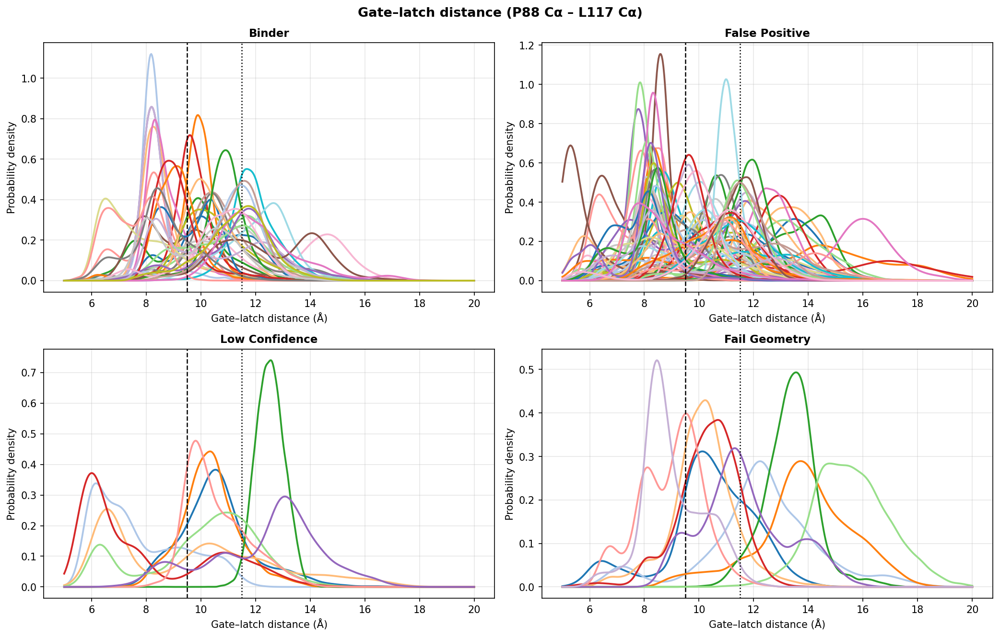

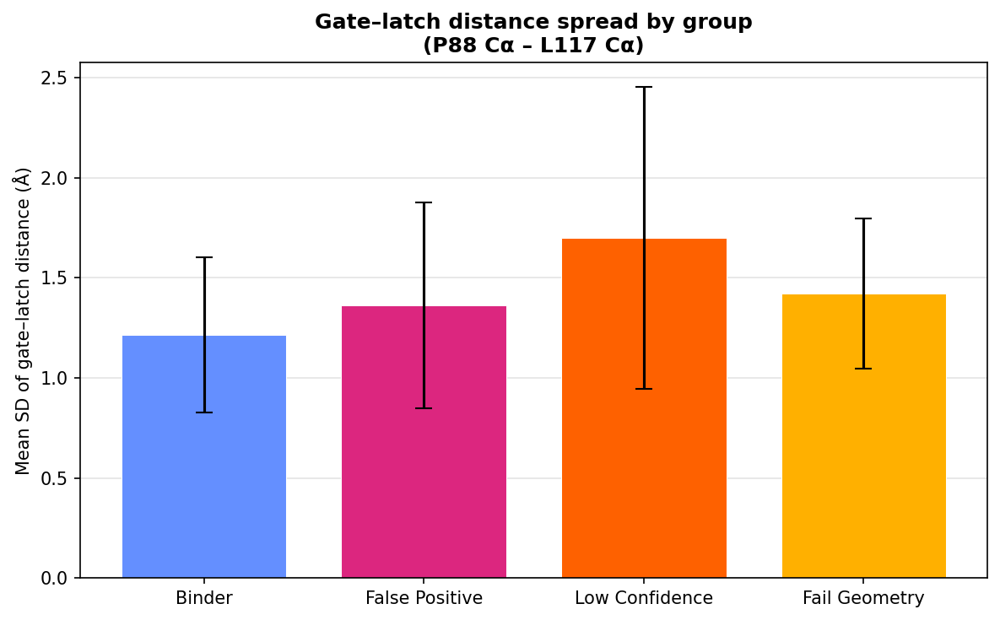

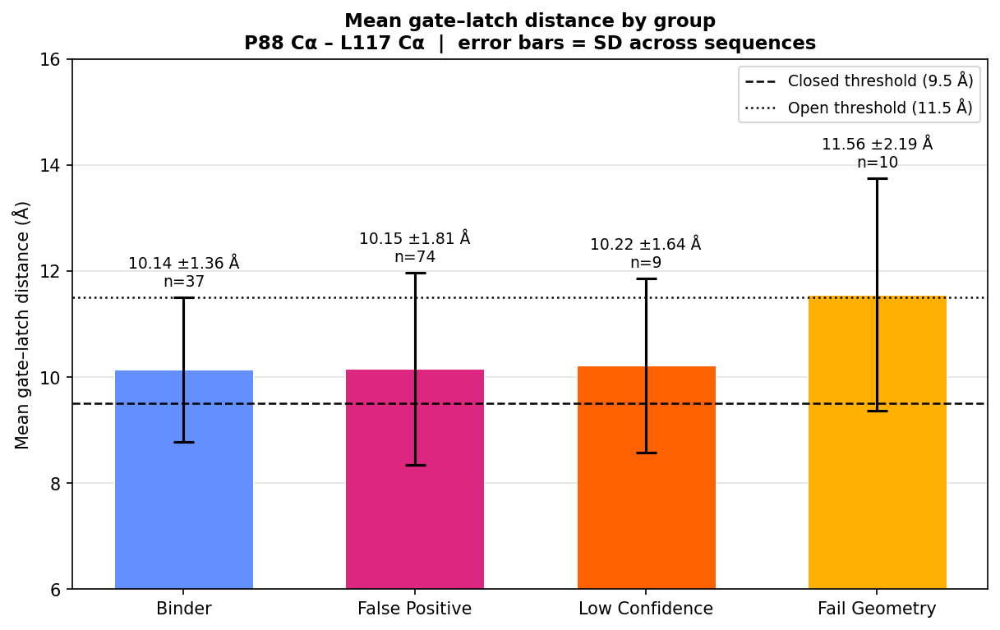

In [ ]:
## Gate - Latch L117
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from scipy.stats import gaussian_kde

base   = "/Users/ivanatang/Library/CloudStorage/OneDrive-UCB-O365/Shirts Lab/LCA_boltz_models"
runrel = "prod_md_0p9_cutoff_3dt_64x1_16PME_642dd"

TYPE_SUBDIR = {
    "binder":    "binders",
    "nb":        "nonbinders",
    "low_pkt":   "neg_low_pkt",
    "fail_gate": "neg_fail_gate",
}

TYPE_GROUP = {
    "binder":    "Binder",
    "nb":        "False Positive",
    "low_pkt":   "Low Confidence",
    "fail_gate": "Fail Geometry",
}

GROUP_COLOR = {
    'Binder':         '#648FFF',   # blue
    'False Positive': '#DC267F',   # magenta
    'Low Confidence': '#FE6100',   # orange
    'Fail Geometry':  '#FFB000',   # gold
}

NM_TO_ANG        = 10.0
CLOSED_THRESHOLD = 0.95   # nm
OPEN_THRESHOLD   = 1.15   # nm

# Legacy seqID-style
legacy_binder_ids = ["seq16", "seq14", "seq10", "seq17", "seq39", "seq42"]
legacy_nb_ids     = ["seq1",  "seq2",  "seq3",  "seq4",  "seq5",  "seq6",  "seq7"]

# New pair_XXXX-style (replace with real IDs)
pair_binder_ids      = ["3069", "3070", "3074", "3092", "3098", 
                        "3059", "3062", "3063", "3066", "3067", 
                        "3068", "3071", "3072", "3073", "3075",
                        "3076", "3077", "3078", "3079", "3080", 
                        "3085", "3086", "3087", "3088", "3091", 
                        "3099", "3100", "3101", "3103", "3104", "3108"]
pair_nb_ids          = ["0777", "0827", "1939", "1824",
                        "0052", "0091", "0246", "0269", "0272",
                        "0276", "0288", "0341", "0351", "0450",
                        "0502", "0506", "0549", "0567", "0584",
                        "0602", "0647", "0684", "0736", "0748",
                        "0765", "0776", "0782", "0811", "0822",
                        "0865", "0867", "0868", "0876", "0878",
                        "0883", "0891", "0908", "0932", "0940",
                        "0974", "0977", "1011", "1023", "1102",
                        "1313", "1397", "1654", "1656", "1658",
                        "1671", "1679", "1709", "1710", "1737",
                        "1758", "1784", "1785", "1792", "1835",
                        "1847", "1860", "1914", "1922", "1938",
                        "1961", "1965"]
pair_low_pkt_ids     = ["0008", "0393", "0482", "1331", "1931",
                        "0065", "0947", "0948", "1413"]
pair_fail_gate_ids   = ["0715", "1094", "1682", "1739", "1941",
                        "0014", "0263", "0540", "0997", "1745"]

# Each entry: (display_name, folder_name, type)
all_sequences = (
    [(sid,                   f"{sid}_binder",      "binder")    for sid in legacy_binder_ids]    +
    [(f"pair_{i}_binder",    f"pair_{i}_binder",   "binder")    for i   in pair_binder_ids]      +
    [(sid,                   f"{sid}_nb",           "nb")        for sid in legacy_nb_ids]        +
    [(f"pair_{i}_nb",        f"pair_{i}_nb",        "nb")        for i   in pair_nb_ids]          +
    [(f"pair_{i}_low_pkt",   f"pair_{i}_low_pkt",   "low_pkt")  for i   in pair_low_pkt_ids]     +
    [(f"pair_{i}_fail_gate", f"pair_{i}_fail_gate", "fail_gate") for i   in pair_fail_gate_ids]
)

def truncate_label(display_name):
    """Shortens a display name to its bare numeric/legacy ID for plot ticks.

    Args:
        display_name (str): e.g. "pair_0091_binder" or "seq16".

    Returns:
        str: Shortened label, e.g. "0091" or "16".
    """
    parts = display_name.split("_")
    if parts[0] == "pair" and len(parts) >= 2:
        return parts[1]
    if display_name.startswith("seq"):
        return display_name[len("seq"):]
    return display_name

def load_timeseries(folder_name, seq_type):
    """Loads a sequence's gate-latch (P88-L117) distance timeseries.

    Args:
        folder_name (str): Sequence's folder name.
        seq_type (str): Short seq_type key (e.g. "binder", "nb").

    Returns:
        numpy.ndarray | None: Distance in nm, or None if the file is
        missing (a warning is printed in that case).
    """
    filepath = os.path.join(base, TYPE_SUBDIR[seq_type], folder_name, runrel,
                            "gate_latch_timeseries.xvg")
    if not os.path.exists(filepath):
        print(f"WARNING: not found — {filepath}")
        return None
    _, dist = get_data(filepath)
    return dist

# Load all timeseries
ts_data = {}   # {display_name: dist_nm array}
for display_name, folder_name, seq_type in all_sequences:
    dist = load_timeseries(folder_name, seq_type)
    if dist is not None:
        ts_data[display_name] = dist

# -------------------------------------------------------------------
# Build one row per sequence
# -------------------------------------------------------------------
rows = []
for display_name, _, seq_type in all_sequences:
    if display_name not in ts_data:
        continue
    dist  = ts_data[display_name]
    n     = len(dist)
    closed = (dist < CLOSED_THRESHOLD).sum() / n
    open_  = (dist > OPEN_THRESHOLD).sum()   / n
    inter  = 1.0 - closed - open_

    rows.append({
        "Sequence":          display_name,
        "Group":             TYPE_GROUP[seq_type],
        "Gate-latch mean (A)": round(dist.mean() * NM_TO_ANG, 4),
        "Gate-latch SD (A)":   round(dist.std(ddof=1) * NM_TO_ANG, 4),
        "Closed % (<9.5 A)":   round(closed * 100, 2),
        "Open % (>11.5 A)":    round(open_  * 100, 2),
        "Intermediate %":      round(inter  * 100, 2),
        "N frames":            n,
    })

df = pd.DataFrame(rows).set_index("Sequence")
print(df.to_string())

# -------------------------------------------------------------------
# Assign per-sequence colors
# -------------------------------------------------------------------
tab20 = plt.get_cmap("tab20")

# group_seqs still needed for panel ordering
group_seqs = {}
for display_name, _, seq_type in all_sequences:
    group = TYPE_GROUP[seq_type]
    group_seqs.setdefault(group, []).append(display_name)

# -------------------------------------------------------------------
# Figure 1: KDE line plots, one panel per group (2x2)
# -------------------------------------------------------------------
group_order = ["Binder", "False Positive", "Low Confidence", "Fail Geometry"]

x_grid = np.linspace(5.0, 20.0, 500)

fig1, axes1 = plt.subplots(2, 2, figsize=(14, 9), dpi=150, sharey=False)
axes1 = axes1.flatten()

for ax, group in zip(axes1, group_order):
    seqs_in_group = group_seqs.get(group, [])
    for i, display_name in enumerate(seqs_in_group):
        if display_name not in ts_data:
            continue
        dist_ang = ts_data[display_name] * NM_TO_ANG
        kde = gaussian_kde(dist_ang, bw_method="scott")
        ax.plot(x_grid, kde(x_grid),
                color=tab20(i % 20), lw=1.8,
                label=truncate_label(display_name))

    ax.axvline(CLOSED_THRESHOLD * NM_TO_ANG, color="black", linestyle="--", lw=1.2,
               label=f"Closed (<{CLOSED_THRESHOLD*NM_TO_ANG:.1f} Å)")
    ax.axvline(OPEN_THRESHOLD   * NM_TO_ANG, color="black", linestyle=":",  lw=1.2,
               label=f"Open (>{OPEN_THRESHOLD*NM_TO_ANG:.1f} Å)")
    ax.set_xlabel("Gate–latch distance (Å)", fontsize=10)
    ax.set_ylabel("Probability density", fontsize=10)
    ax.set_title(f"{group}", fontsize=11, fontweight="bold")
    # ax.legend(ncol=1, fontsize=8)
    ax.grid(True, alpha=0.3)

fig1.suptitle("Gate–latch distance (P88 Cα – L117 Cα)", fontsize=13, fontweight="bold")
plt.tight_layout()

# -------------------------------------------------------------------
# Figure 2: group-average SD of gate-latch distance
# -------------------------------------------------------------------
group_mean_sds = []
group_sd_sds   = []

for group in group_order:
    seqs_in_group = group_seqs.get(group, [])
    sds = [ts_data[dn].std(ddof=1) * NM_TO_ANG
           for dn in seqs_in_group if dn in ts_data]
    group_mean_sds.append(np.mean(sds)             if sds        else np.nan)
    group_sd_sds.append(  np.std(sds, ddof=1)      if len(sds)>1 else np.nan)

x2 = np.arange(len(group_order))
colors2 = [GROUP_COLOR[g] for g in group_order]

fig2, ax2 = plt.subplots(figsize=(8, 5), dpi=150)

ax2.bar(x2, group_mean_sds, yerr=group_sd_sds, color=colors2,
        capsize=5, edgecolor="white", linewidth=0.5, width=0.75)

ax2.set_xticks(x2)
ax2.set_xticklabels(group_order, fontsize=10)
ax2.set_ylabel("Mean SD of gate–latch distance (Å)", fontsize=10)
ax2.set_title("Gate–latch distance spread by group\n(P88 Cα – L117 Cα)",
              fontsize=12, fontweight="bold")
ax2.grid(True, axis="y", alpha=0.35)
ax2.set_axisbelow(True)
plt.tight_layout()
plt.show()

# -------------------------------------------------------------------
# Figure 3: group mean gate-latch distance ± SD (all sequences)
# -------------------------------------------------------------------
group_means, group_sds, group_ns = [], [], []

for group in group_order:
    seqs_in_group = group_seqs.get(group, [])
    means_ang = [ts_data[dn].mean() * NM_TO_ANG
                 for dn in seqs_in_group if dn in ts_data]
    group_means.append(np.mean(means_ang)        if means_ang        else np.nan)
    group_sds.append(  np.std(means_ang, ddof=1) if len(means_ang)>1 else np.nan)
    group_ns.append(len(means_ang))

x3      = np.arange(len(group_order))
colors3 = [GROUP_COLOR[g] for g in group_order]

fig3, ax3 = plt.subplots(figsize=(8, 5), dpi=150, constrained_layout=True)

ax3.bar(x3, group_means, yerr=group_sds, color=colors3,
        capsize=6, edgecolor="white", linewidth=0.5, width=0.6,
        error_kw=dict(elinewidth=1.5, ecolor="black", capthick=1.5))

for xi, (mean, sd, n) in enumerate(zip(group_means, group_sds, group_ns)):
    if np.isnan(mean):
        continue
    sd_str = f"±{sd:.2f}" if not np.isnan(sd) else ""
    ax3.text(xi, mean + (sd if not np.isnan(sd) else 0) + 0.15,
             f"{mean:.2f} {sd_str} Å\nn={n}",
             ha="center", va="bottom", fontsize=9, color="black")

ax3.axhline(CLOSED_THRESHOLD * NM_TO_ANG, color="black", linestyle="--",
            lw=1.2, label=f"Closed threshold ({CLOSED_THRESHOLD * NM_TO_ANG:.1f} Å)")
ax3.axhline(OPEN_THRESHOLD   * NM_TO_ANG, color="black", linestyle=":",
            lw=1.2, label=f"Open threshold ({OPEN_THRESHOLD * NM_TO_ANG:.1f} Å)")

ax3.set_xticks(x3)
ax3.set_xticklabels(group_order, fontsize=10)
ax3.set_ylabel("Mean gate–latch distance (Å)", fontsize=10)
ax3.set_title("Mean gate–latch distance by group\n"
              "P88 Cα – L117 Cα  |  error bars = SD across sequences",
              fontsize=11, fontweight="bold")
ax3.set_ylim(6,16)
ax3.legend(fontsize=9)
ax3.grid(True, axis="y", alpha=0.35)
ax3.set_axisbelow(True)

plt.show()

# -------------------------------------------------------------------
# Optional: save outputs
# -------------------------------------------------------------------
# fig1.savefig(os.path.join(base, "analysis", "gate_latch_kde.png"), dpi=300, bbox_inches="tight")
# fig2.savefig(os.path.join(base, "analysis", "gate_latch_SD_groups.png"),        dpi=300, bbox_inches="tight")
# fig3.savefig(os.path.join(base, "analysis", "gate_latch_mean_by_group.png"), dpi=300, bbox_inches="tight")
# df.to_csv(os.path.join(base, "analysis", "gate_latch_summary.csv"))


OUTLIER REPORT (IQR ×1.5, within each group)
  [ Low Confidence]  pair_0393_low_pkt               mean=7.77 Å outside [8.25, 12.01]
  [ Low Confidence]  pair_0947_low_pkt               mean=8.03 Å outside [8.25, 12.01]
  [ Low Confidence]  pair_1413_low_pkt               mean=12.39 Å outside [8.25, 12.01]
  [ Low Confidence]  pair_1931_low_pkt               mean=12.53 Å outside [8.25, 12.01]
  [         Binder]  pair_3063_binder                SD=2.29 Å outside [0.15, 2.17]
  [ False Positive]  seq3                            SD=2.62 Å outside [0.12, 2.58]
  [ False Positive]  seq7                            SD=3.38 Å outside [0.12, 2.58]

Kept / Removed per group:
  Binder            : 36 kept, 1 removed
  False Positive    : 72 kept, 2 removed
  Low Confidence    : 5 kept, 4 removed
  Fail Geometry     : 10 kept, 0 removed


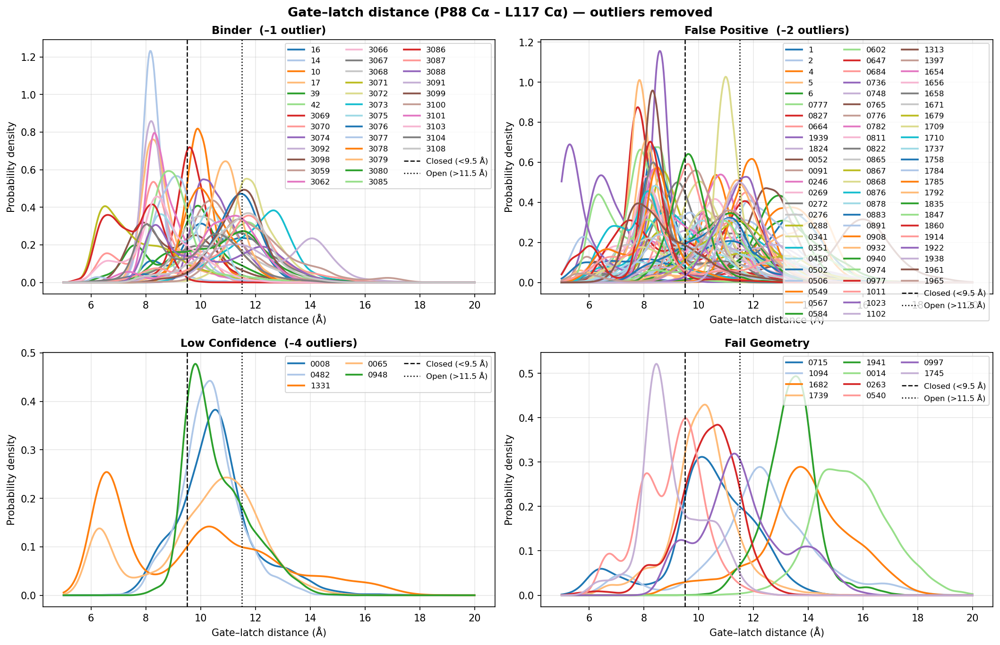

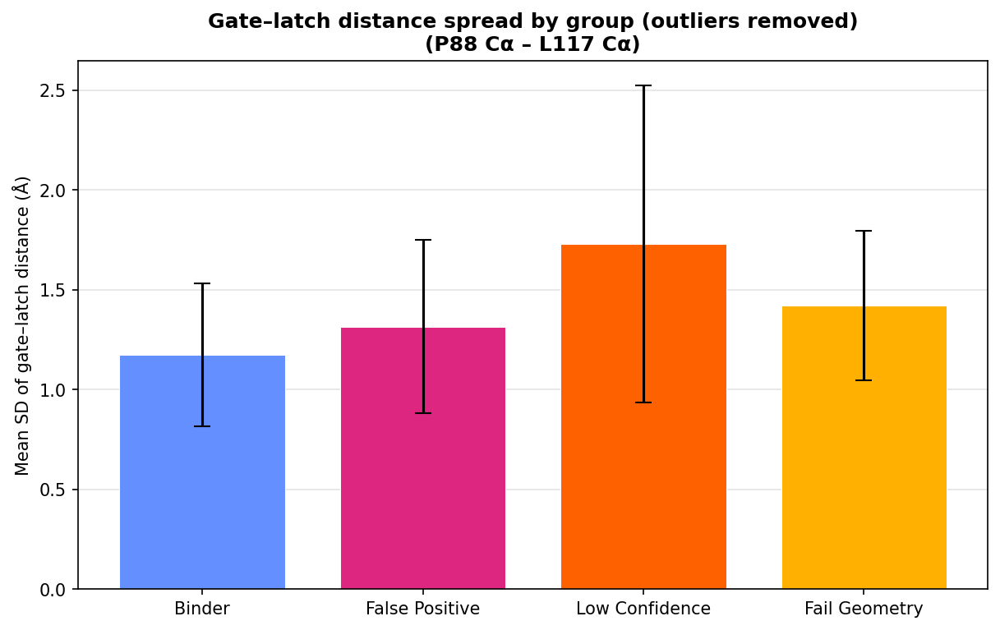

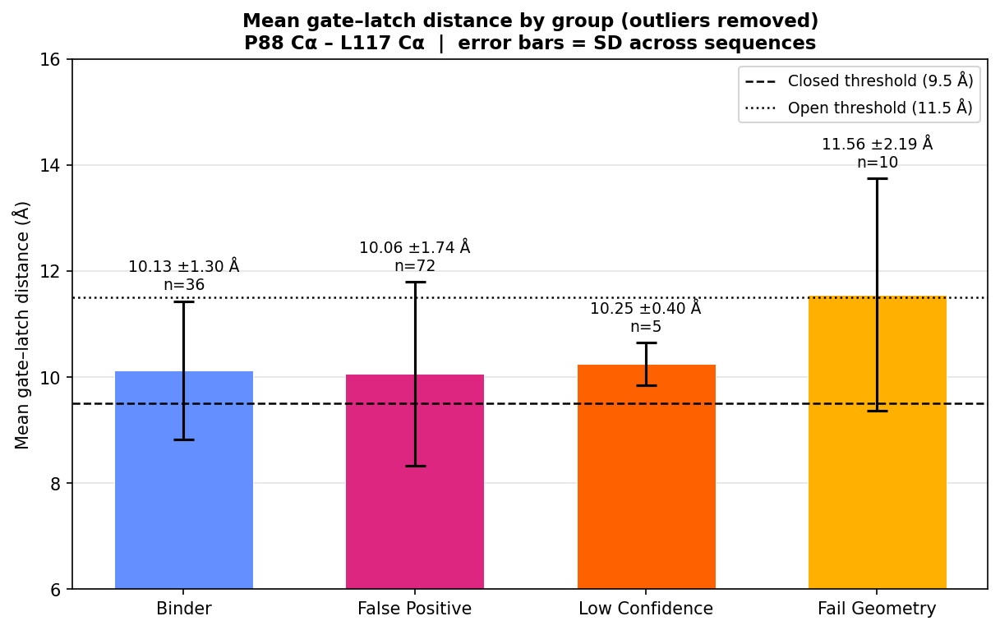

In [14]:
## Gate - Latch L117 — with intra-group outlier removal
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

base   = "/Users/ivanatang/Library/CloudStorage/OneDrive-UCB-O365/Shirts Lab/LCA_boltz_models"
runrel = "prod_md_0p9_cutoff_3dt_64x1_16PME_642dd"

TYPE_SUBDIR = {
    "binder":    "binders",
    "nb":        "nonbinders",
    "low_pkt":   "neg_low_pkt",
    "fail_gate": "neg_fail_gate",
}
TYPE_GROUP = {
    "binder":    "Binder",
    "nb":        "False Positive",
    "low_pkt":   "Low Confidence",
    "fail_gate": "Fail Geometry",
}
GROUP_COLOR = {
    'Binder':         '#648FFF',
    'False Positive': '#DC267F',
    'Low Confidence': '#FE6100',
    'Fail Geometry':  '#FFB000',
}

NM_TO_ANG        = 10.0
CLOSED_THRESHOLD = 0.95   # nm
OPEN_THRESHOLD   = 1.15   # nm

# ── Outlier detection parameters ──────────────────────────────────────────────
IQR_MULTIPLIER   = 1.5    # standard Tukey fence; increase to 2.0 to be more lenient
FLAG_ON_MEAN     = True   # flag sequences whose mean is an intra-group outlier
FLAG_ON_SD       = True  # optionally also flag sequences with outlier SD (high spread)
# ──────────────────────────────────────────────────────────────────────────────

legacy_binder_ids = ["seq16", "seq14", "seq10", "seq17", "seq39", "seq42"]
legacy_nb_ids     = ["seq1",  "seq2",  "seq3",  "seq4",  "seq5",  "seq6",  "seq7"]

pair_binder_ids      = ["3069", "3070", "3074", "3092", "3098",
                        "3059", "3062", "3063", "3066", "3067",
                        "3068", "3071", "3072", "3073", "3075",
                        "3076", "3077", "3078", "3079", "3080",
                        "3085", "3086", "3087", "3088", "3091",
                        "3099", "3100", "3101", "3103", "3104", "3108"]
pair_nb_ids          = ["0777", "0827", "1939", "1824",
                        "0052", "0091", "0246", "0269", "0272",
                        "0276", "0288", "0341", "0351", "0450",
                        "0502", "0506", "0549", "0567", "0584",
                        "0602", "0647", "0684", "0736", "0748",
                        "0765", "0776", "0782", "0811", "0822",
                        "0865", "0867", "0868", "0876", "0878",
                        "0883", "0891", "0908", "0932", "0940",
                        "0974", "0977", "1011", "1023", "1102",
                        "1313", "1397", "1654", "1656", "1658",
                        "1671", "1679", "1709", "1710", "1737",
                        "1758", "1784", "1785", "1792", "1835",
                        "1847", "1860", "1914", "1922", "1938",
                        "1961", "1965"]
pair_low_pkt_ids     = ["0008", "0393", "0482", "1331", "1931",
                        "0065", "0947", "0948", "1413"]
pair_fail_gate_ids   = ["0715", "1094", "1682", "1739", "1941",
                        "0014", "0263", "0540", "0997", "1745"]

all_sequences = (
    [(sid,                   f"{sid}_binder",      "binder")    for sid in legacy_binder_ids]    +
    [(f"pair_{i}_binder",    f"pair_{i}_binder",   "binder")    for i   in pair_binder_ids]      +
    [(sid,                   f"{sid}_nb",           "nb")        for sid in legacy_nb_ids]        +
    [(f"pair_{i}_nb",        f"pair_{i}_nb",        "nb")        for i   in pair_nb_ids]          +
    [(f"pair_{i}_low_pkt",   f"pair_{i}_low_pkt",   "low_pkt")  for i   in pair_low_pkt_ids]     +
    [(f"pair_{i}_fail_gate", f"pair_{i}_fail_gate", "fail_gate") for i   in pair_fail_gate_ids]
)

def truncate_label(display_name):
    """Shortens a display name to its bare numeric/legacy ID for plot ticks.

    Args:
        display_name (str): e.g. "pair_0091_binder" or "seq16".

    Returns:
        str: Shortened label, e.g. "0091" or "16".
    """
    parts = display_name.split("_")
    if parts[0] == "pair" and len(parts) >= 2:
        return parts[1]
    if display_name.startswith("seq"):
        return display_name[len("seq"):]
    return display_name

def get_data(filepath):
    """Parses a two-column .xvg file, skipping GROMACS header lines.

    Args:
        filepath (str): Path to a GROMACS .xvg file.

    Returns:
        tuple[numpy.ndarray, numpy.ndarray]: (x, y) columns as float arrays.
    """
    times, vals = [], []
    with open(filepath) as f:
        for line in f:
            if line.startswith(('#', '@')):
                continue
            cols = line.split()
            if len(cols) >= 2:
                times.append(float(cols[0]))
                vals.append(float(cols[1]))
    return np.array(times), np.array(vals)

def load_timeseries(folder_name, seq_type):
    """Loads a sequence's gate-latch (P88-L117) distance timeseries.

    Args:
        folder_name (str): Sequence's folder name.
        seq_type (str): Short seq_type key (e.g. "binder", "nb").

    Returns:
        numpy.ndarray | None: Distance in nm, or None if the file is
        missing (a warning is printed in that case).
    """
    filepath = os.path.join(base, TYPE_SUBDIR[seq_type], folder_name, runrel,
                            "gate_latch_timeseries.xvg")
    if not os.path.exists(filepath):
        print(f"WARNING: not found — {filepath}")
        return None
    _, dist = get_data(filepath)
    return dist

# ── Load all timeseries ───────────────────────────────────────────────────────
ts_data = {}
for display_name, folder_name, seq_type in all_sequences:
    dist = load_timeseries(folder_name, seq_type)
    if dist is not None:
        ts_data[display_name] = dist

# ── Build summary table ───────────────────────────────────────────────────────
rows = []
for display_name, _, seq_type in all_sequences:
    if display_name not in ts_data:
        continue
    dist  = ts_data[display_name]
    n     = len(dist)
    mean_ang = dist.mean() * NM_TO_ANG
    sd_ang   = dist.std(ddof=1) * NM_TO_ANG
    closed   = (dist < CLOSED_THRESHOLD).sum() / n
    open_    = (dist > OPEN_THRESHOLD).sum()   / n

    rows.append({
        "Sequence":            display_name,
        "Group":               TYPE_GROUP[seq_type],
        "Mean (Å)":            round(mean_ang, 4),
        "SD (Å)":              round(sd_ang,   4),
        "Closed % (<9.5 Å)":  round(closed * 100, 2),
        "Open % (>11.5 Å)":   round(open_  * 100, 2),
        "N frames":            n,
    })

df = pd.DataFrame(rows).set_index("Sequence")

# ── IQR-based outlier detection within each group ────────────────────────────
def iqr_bounds(values, multiplier=1.5):
    """Computes Tukey fences (IQR-based outlier bounds) for a 1-D array.

    Args:
        values: Array-like of numeric values.
        multiplier (float): IQR multiplier for the fences (default: 1.5,
            the standard Tukey fence; use 2.0 to be more lenient).

    Returns:
        tuple[float, float]: (lower, upper) bounds.
    """
    q1, q3 = np.percentile(values, [25, 75])
    iqr = q3 - q1
    return q1 - multiplier * iqr, q3 + multiplier * iqr

outlier_flags = {}   # {display_name: list of reasons}

for group in df["Group"].unique():
    grp = df[df["Group"] == group]

    if FLAG_ON_MEAN:
        lo, hi = iqr_bounds(grp["Mean (Å)"].values, IQR_MULTIPLIER)
        for seq, row in grp.iterrows():
            if row["Mean (Å)"] < lo or row["Mean (Å)"] > hi:
                outlier_flags.setdefault(seq, []).append(
                    f"mean={row['Mean (Å)']:.2f} Å outside [{lo:.2f}, {hi:.2f}]"
                )

    if FLAG_ON_SD:
        lo_sd, hi_sd = iqr_bounds(grp["SD (Å)"].values, IQR_MULTIPLIER)
        for seq, row in grp.iterrows():
            if row["SD (Å)"] < lo_sd or row["SD (Å)"] > hi_sd:
                outlier_flags.setdefault(seq, []).append(
                    f"SD={row['SD (Å)']:.2f} Å outside [{lo_sd:.2f}, {hi_sd:.2f}]"
                )

# ── Print outlier report ──────────────────────────────────────────────────────
print("\n" + "="*60)
print("OUTLIER REPORT (IQR ×{:.1f}, within each group)".format(IQR_MULTIPLIER))
print("="*60)
if outlier_flags:
    for seq, reasons in sorted(outlier_flags.items()):
        group = df.loc[seq, "Group"]
        for r in reasons:
            print(f"  [{group:>15s}]  {seq:<30s}  {r}")
else:
    print("  No outliers detected.")

print("\nKept / Removed per group:")
for group in ["Binder", "False Positive", "Low Confidence", "Fail Geometry"]:
    grp_seqs  = df[df["Group"] == group].index.tolist()
    n_total   = len(grp_seqs)
    n_removed = sum(1 for s in grp_seqs if s in outlier_flags)
    print(f"  {group:<18s}: {n_total - n_removed} kept, {n_removed} removed")

# ── Filter ts_data ────────────────────────────────────────────────────────────
ts_clean = {k: v for k, v in ts_data.items() if k not in outlier_flags}

# rebuild group_seqs using only clean sequences
group_seqs_clean = {}
for display_name, _, seq_type in all_sequences:
    if display_name not in ts_clean:
        continue
    group = TYPE_GROUP[seq_type]
    group_seqs_clean.setdefault(group, []).append(display_name)

# ── Figure 1: KDE panels (cleaned) ───────────────────────────────────────────
group_order = ["Binder", "False Positive", "Low Confidence", "Fail Geometry"]
x_grid      = np.linspace(5.0, 20.0, 500)
tab20       = plt.get_cmap("tab20")

fig1, axes1 = plt.subplots(2, 2, figsize=(14, 9), dpi=150, sharey=False,
                            constrained_layout=True)
axes1 = axes1.flatten()

for ax, group in zip(axes1, group_order):
    seqs_in_group = group_seqs_clean.get(group, [])
    n_removed     = sum(1 for s in df[df["Group"] == group].index if s in outlier_flags)

    for i, display_name in enumerate(seqs_in_group):
        dist_ang = ts_clean[display_name] * NM_TO_ANG
        kde = gaussian_kde(dist_ang, bw_method="scott")
        ax.plot(x_grid, kde(x_grid),
                color=tab20(i % 20), lw=1.8,
                label=truncate_label(display_name))

    ax.axvline(CLOSED_THRESHOLD * NM_TO_ANG, color="black", linestyle="--", lw=1.2,
               label=f"Closed (<{CLOSED_THRESHOLD*NM_TO_ANG:.1f} Å)")
    ax.axvline(OPEN_THRESHOLD   * NM_TO_ANG, color="black", linestyle=":",  lw=1.2,
               label=f"Open (>{OPEN_THRESHOLD*NM_TO_ANG:.1f} Å)")

    title_suffix = f"  (–{n_removed} outlier{'s' if n_removed!=1 else ''})" if n_removed else ""
    ax.set_xlabel("Gate–latch distance (Å)", fontsize=10)
    ax.set_ylabel("Probability density", fontsize=10)
    ax.set_title(f"{group}{title_suffix}", fontsize=11, fontweight="bold")
    ax.legend(ncol=3, fontsize=8)
    ax.grid(True, alpha=0.3)

fig1.suptitle("Gate–latch distance (P88 Cα – L117 Cα) — outliers removed",
              fontsize=13, fontweight="bold")

# ── Figure 2: group SD bar chart (cleaned) ───────────────────────────────────
group_mean_sds, group_sd_sds = [], []
for group in group_order:
    sds = [ts_clean[dn].std(ddof=1) * NM_TO_ANG
           for dn in group_seqs_clean.get(group, []) if dn in ts_clean]
    group_mean_sds.append(np.mean(sds)        if sds        else np.nan)
    group_sd_sds.append(  np.std(sds, ddof=1) if len(sds)>1 else np.nan)

x2      = np.arange(len(group_order))
colors2 = [GROUP_COLOR[g] for g in group_order]

fig2, ax2 = plt.subplots(figsize=(8, 5), dpi=150, constrained_layout=True)
ax2.bar(x2, group_mean_sds, yerr=group_sd_sds, color=colors2,
        capsize=5, edgecolor="white", linewidth=0.5, width=0.75)
ax2.set_xticks(x2)
ax2.set_xticklabels(group_order, fontsize=10)
ax2.set_ylabel("Mean SD of gate–latch distance (Å)", fontsize=10)
ax2.set_title("Gate–latch distance spread by group (outliers removed)\n(P88 Cα – L117 Cα)",
              fontsize=12, fontweight="bold")
ax2.grid(True, axis="y", alpha=0.35)
ax2.set_axisbelow(True)

plt.show()

# ── Figure 3: group mean gate-latch distance ± SD ────────────────────────────
group_means, group_sds, group_ns = [], [], []

for group in group_order:
    seqs = group_seqs_clean.get(group, [])
    means_ang = [ts_clean[dn].mean() * NM_TO_ANG for dn in seqs if dn in ts_clean]
    group_means.append(np.mean(means_ang)        if means_ang        else np.nan)
    group_sds.append(  np.std(means_ang, ddof=1) if len(means_ang)>1 else np.nan)
    group_ns.append(len(means_ang))

x3      = np.arange(len(group_order))
colors3 = [GROUP_COLOR[g] for g in group_order]

fig3, ax3 = plt.subplots(figsize=(8, 5), dpi=150, constrained_layout=True)

bars = ax3.bar(x3, group_means, yerr=group_sds, color=colors3,
               capsize=6, edgecolor="white", linewidth=0.5, width=0.6,
               error_kw=dict(elinewidth=1.5, ecolor="black", capthick=1.5))

# annotate each bar with n and the mean ± SD value
for xi, (mean, sd, n) in enumerate(zip(group_means, group_sds, group_ns)):
    if np.isnan(mean):
        continue
    sd_str = f"±{sd:.2f}" if not np.isnan(sd) else ""
    ax3.text(xi, mean + (sd if not np.isnan(sd) else 0) + 0.15,
             f"{mean:.2f} {sd_str} Å\nn={n}",
             ha="center", va="bottom", fontsize=9, color="black")

ax3.axhline(CLOSED_THRESHOLD * NM_TO_ANG, color="black", linestyle="--",
            lw=1.2, label=f"Closed threshold ({CLOSED_THRESHOLD*NM_TO_ANG:.1f} Å)")
ax3.axhline(OPEN_THRESHOLD   * NM_TO_ANG, color="black", linestyle=":",
            lw=1.2, label=f"Open threshold ({OPEN_THRESHOLD*NM_TO_ANG:.1f} Å)")

ax3.set_xticks(x3)
ax3.set_xticklabels(group_order, fontsize=10)
ax3.set_ylabel("Mean gate–latch distance (Å)", fontsize=10)
ax3.set_title("Mean gate–latch distance by group (outliers removed)\n"
              "P88 Cα – L117 Cα  |  error bars = SD across sequences",
              fontsize=11, fontweight="bold")
ax3.set_ylim(6,16)
ax3.legend(fontsize=9)
ax3.grid(True, axis="y", alpha=0.35)
ax3.set_axisbelow(True)

plt.show()

# ── Save ──────────────────────────────────────────────────────────────────────
fig1.savefig(os.path.join(base, "analysis", "gate_latch_kde_no_outliers.png"), dpi=300, bbox_inches="tight")
fig2.savefig(os.path.join(base, "analysis", "gate_latch_SD_groups_no_outliers.png"), dpi=300, bbox_inches="tight")
fig3.savefig(os.path.join(base, "analysis", "gate_latch_mean_by_group_no_outliers.png"), dpi=300, bbox_inches="tight")

                              Group  Gate-latch mean (A)  Gate-latch SD (A)  Closed % (<9.5 A)  Open % (>11.5 A)  Intermediate %  N frames
Sequence                                                                                                                                  
seq10                        Binder               8.6669             0.7196              91.41              0.03            8.56     13334
seq17                        Binder               8.0664             0.7656              94.52              0.34            5.14     13334
seq39                        Binder               8.0827             1.4235              88.28              0.20           11.52     13334
seq42                        Binder               5.9311             0.9658              98.61              0.07            1.31     13334
pair_3069_binder             Binder               6.2136             0.8254             100.00              0.00            0.00     13334
pair_3070_binder           

/var/folders/b1/77x_k7v964g1hhhp9pz24yr40000gn/T/ipykernel_1795/1578543547.py:173: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()


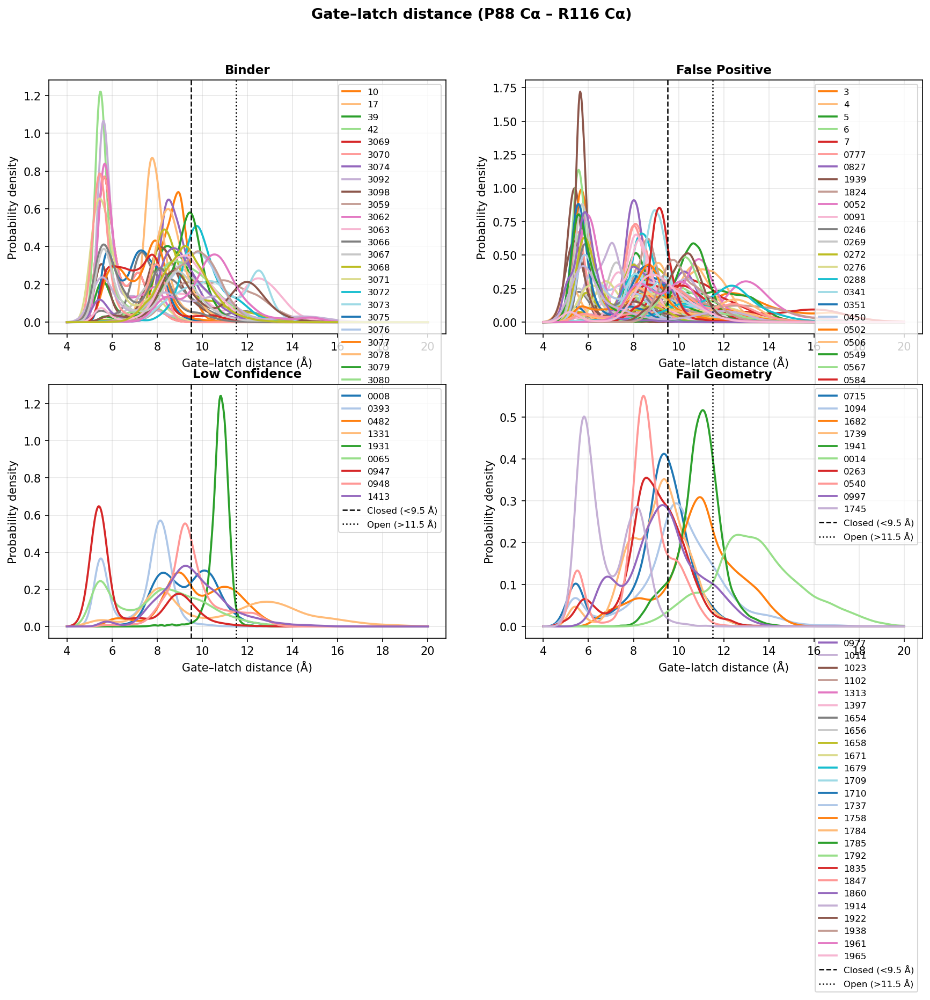

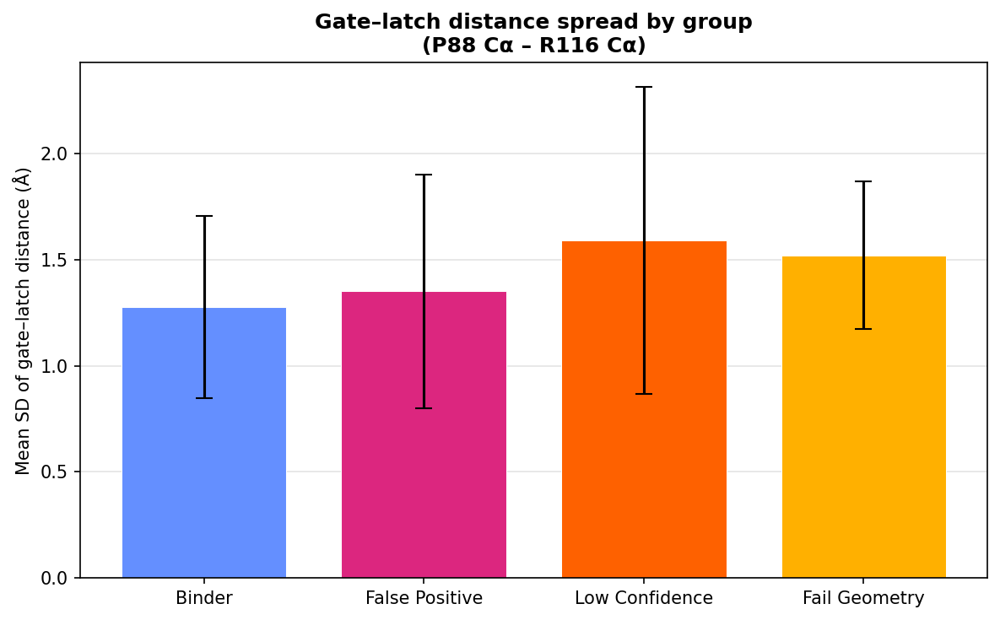

In [15]:
## Gate - Latch R116 
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from scipy.stats import gaussian_kde

base   = "/Users/ivanatang/Library/CloudStorage/OneDrive-UCB-O365/Shirts Lab/LCA_boltz_models"
runrel = "prod_md_0p9_cutoff_3dt_64x1_16PME_642dd"

TYPE_SUBDIR = {
    "binder":    "binders",
    "nb":        "nonbinders",
    "low_pkt":   "neg_low_pkt",
    "fail_gate": "neg_fail_gate",
}

TYPE_GROUP = {
    "binder":    "Binder",
    "nb":        "False Positive",
    "low_pkt":   "Low Confidence",
    "fail_gate": "Fail Geometry",
}

GROUP_COLOR = {
    'Binder':         '#648FFF',   # blue
    'False Positive': '#DC267F',   # magenta
    'Low Confidence': '#FE6100',   # orange
    'Fail Geometry':  '#FFB000',   # gold
}

NM_TO_ANG        = 10.0
CLOSED_THRESHOLD = 0.95   # nm
OPEN_THRESHOLD   = 1.15   # nm

# Legacy seqID-style
legacy_binder_ids = ["seq16", "seq14", "seq10", "seq17", "seq39", "seq42"]
legacy_nb_ids     = ["seq1",  "seq2",  "seq3",  "seq4",  "seq5",  "seq6",  "seq7"]

# New pair_XXXX-style (replace with real IDs)
pair_binder_ids      = ["3069", "3070", "3074", "3092", "3098", 
                        "3059", "3062", "3063", "3066", "3067", 
                        "3068", "3071", "3072", "3073", "3075",
                        "3076", "3077", "3078", "3079", "3080", 
                        "3085", "3086", "3087", "3088", "3091", 
                        "3099", "3100", "3101", "3103", "3104", "3108"]
pair_nb_ids          = ["0777", "0827", "1939", "1824",
                        "0052", "0091", "0246", "0269", "0272",
                        "0276", "0288", "0341", "0351", "0450",
                        "0502", "0506", "0549", "0567", "0584",
                        "0602", "0647", "0684", "0736", "0748",
                        "0765", "0776", "0782", "0811", "0822",
                        "0865", "0867", "0868", "0876", "0878",
                        "0883", "0891", "0908", "0932", "0940",
                        "0974", "0977", "1011", "1023", "1102",
                        "1313", "1397", "1654", "1656", "1658",
                        "1671", "1679", "1709", "1710", "1737",
                        "1758", "1784", "1785", "1792", "1835",
                        "1847", "1860", "1914", "1922", "1938",
                        "1961", "1965"]
pair_low_pkt_ids     = ["0008", "0393", "0482", "1331", "1931",
                        "0065", "0947", "0948", "1413"]
pair_fail_gate_ids   = ["0715", "1094", "1682", "1739", "1941",
                        "0014", "0263", "0540", "0997", "1745"]

# Each entry: (display_name, folder_name, type)
all_sequences = (
    [(sid,                   f"{sid}_binder",      "binder")    for sid in legacy_binder_ids]    +
    [(f"pair_{i}_binder",    f"pair_{i}_binder",   "binder")    for i   in pair_binder_ids]      +
    [(sid,                   f"{sid}_nb",           "nb")        for sid in legacy_nb_ids]        +
    [(f"pair_{i}_nb",        f"pair_{i}_nb",        "nb")        for i   in pair_nb_ids]          +
    [(f"pair_{i}_low_pkt",   f"pair_{i}_low_pkt",   "low_pkt")  for i   in pair_low_pkt_ids]     +
    [(f"pair_{i}_fail_gate", f"pair_{i}_fail_gate", "fail_gate") for i   in pair_fail_gate_ids]
)

def truncate_label(display_name):
    """Shortens a display name to its bare numeric/legacy ID for plot ticks.

    Args:
        display_name (str): e.g. "pair_0091_binder" or "seq16".

    Returns:
        str: Shortened label, e.g. "0091" or "16".
    """
    parts = display_name.split("_")
    if parts[0] == "pair" and len(parts) >= 2:
        return parts[1]
    if display_name.startswith("seq"):
        return display_name[len("seq"):]
    return display_name

def load_timeseries(folder_name, seq_type):
    """Loads a sequence's gate-latch (P88-R116) distance timeseries.

    Args:
        folder_name (str): Sequence's folder name.
        seq_type (str): Short seq_type key (e.g. "binder", "nb").

    Returns:
        numpy.ndarray | None: Distance in nm, or None if the file is
        missing (a warning is printed in that case).
    """
    filepath = os.path.join(base, TYPE_SUBDIR[seq_type], folder_name, runrel,
                            "gate_latch116_timeseries.xvg")
    if not os.path.exists(filepath):
        print(f"WARNING: not found — {filepath}")
        return None
    _, dist = get_data(filepath)
    return dist

# Load all timeseries
ts_data = {}   # {display_name: dist_nm array}
for display_name, folder_name, seq_type in all_sequences:
    dist = load_timeseries(folder_name, seq_type)
    if dist is not None:
        ts_data[display_name] = dist

# -------------------------------------------------------------------
# Build one row per sequence
# -------------------------------------------------------------------
rows = []
for display_name, _, seq_type in all_sequences:
    if display_name not in ts_data:
        continue
    dist  = ts_data[display_name]
    n     = len(dist)
    closed = (dist < CLOSED_THRESHOLD).sum() / n
    open_  = (dist > OPEN_THRESHOLD).sum()   / n
    inter  = 1.0 - closed - open_

    rows.append({
        "Sequence":          display_name,
        "Group":             TYPE_GROUP[seq_type],
        "Gate-latch mean (A)": round(dist.mean() * NM_TO_ANG, 4),
        "Gate-latch SD (A)":   round(dist.std(ddof=1) * NM_TO_ANG, 4),
        "Closed % (<9.5 A)":   round(closed * 100, 2),
        "Open % (>11.5 A)":    round(open_  * 100, 2),
        "Intermediate %":      round(inter  * 100, 2),
        "N frames":            n,
    })

df = pd.DataFrame(rows).set_index("Sequence")
print(df.to_string())

# df.to_csv(os.path.join(base, "analysis", "gate_latch_summary.csv"))

# -------------------------------------------------------------------
# Assign per-sequence colors
# -------------------------------------------------------------------
tab20 = plt.get_cmap("tab20")

# group_seqs still needed for panel ordering
group_seqs = {}
for display_name, _, seq_type in all_sequences:
    group = TYPE_GROUP[seq_type]
    group_seqs.setdefault(group, []).append(display_name)

# -------------------------------------------------------------------
# Figure 1: KDE line plots, one panel per group (2x2)
# -------------------------------------------------------------------
x_grid = np.linspace(4.0, 20.0, 500)

fig1, axes1 = plt.subplots(2, 2, figsize=(14, 9), dpi=150, sharey=False)
axes1 = axes1.flatten()

for ax, group in zip(axes1, group_order):
    seqs_in_group = group_seqs.get(group, [])
    for i, display_name in enumerate(seqs_in_group):
        if display_name not in ts_data:
            continue
        dist_ang = ts_data[display_name] * NM_TO_ANG
        kde = gaussian_kde(dist_ang, bw_method="scott")
        ax.plot(x_grid, kde(x_grid),
                color=tab20(i % 20), lw=1.8,
                label=truncate_label(display_name))

    ax.axvline(CLOSED_THRESHOLD * NM_TO_ANG, color="black", linestyle="--", lw=1.2,
               label=f"Closed (<{CLOSED_THRESHOLD*NM_TO_ANG:.1f} Å)")
    ax.axvline(OPEN_THRESHOLD   * NM_TO_ANG, color="black", linestyle=":",  lw=1.2,
               label=f"Open (>{OPEN_THRESHOLD*NM_TO_ANG:.1f} Å)")
    ax.set_xlabel("Gate–latch distance (Å)", fontsize=10)
    ax.set_ylabel("Probability density", fontsize=10)
    ax.set_title(f"{group}", fontsize=11, fontweight="bold")
    ax.legend(fontsize=8)
    ax.grid(True, alpha=0.3)

fig1.suptitle("Gate–latch distance (P88 Cα – R116 Cα)", fontsize=13, fontweight="bold")
plt.tight_layout()

# -------------------------------------------------------------------
# Figure 2: group-average SD of gate-latch distance
# -------------------------------------------------------------------
group_mean_sds = []
group_sd_sds   = []

for group in group_order:
    seqs_in_group = group_seqs.get(group, [])
    sds = [ts_data[dn].std(ddof=1) * NM_TO_ANG
           for dn in seqs_in_group if dn in ts_data]
    group_mean_sds.append(np.mean(sds)             if sds        else np.nan)
    group_sd_sds.append(  np.std(sds, ddof=1)      if len(sds)>1 else np.nan)

x2 = np.arange(len(group_order))
colors2 = [GROUP_COLOR[g] for g in group_order]

fig2, ax2 = plt.subplots(figsize=(8, 5), dpi=150)

ax2.bar(x2, group_mean_sds, yerr=group_sd_sds, color=colors2,
        capsize=5, edgecolor="white", linewidth=0.5, width=0.75)

ax2.set_xticks(x3)
ax2.set_xticklabels(group_order, fontsize=10)
ax2.set_ylabel("Mean SD of gate–latch distance (Å)", fontsize=10)
ax2.set_title("Gate–latch distance spread by group\n(P88 Cα – R116 Cα)",
              fontsize=12, fontweight="bold")
ax2.grid(True, axis="y", alpha=0.35)
ax2.set_axisbelow(True)
plt.tight_layout()
plt.show()

# -------------------------------------------------------------------
# Optional: save outputs
# -------------------------------------------------------------------
# fig1.savefig(os.path.join(base, "analysis", "gate_latchR116_kde.png"),        dpi=300, bbox_inches="tight")
# fig2.savefig(os.path.join(base, "analysis", "gate_latchR116_SD_groups.png"), dpi=300, bbox_inches="tight")
# df.to_csv(os.path.join(base, "analysis", "gate_latchR116_summary.csv"))

## Gate-Latch comparison with 50% frames

/var/folders/b1/77x_k7v964g1hhhp9pz24yr40000gn/T/ipykernel_1330/2616387764.py:151: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()


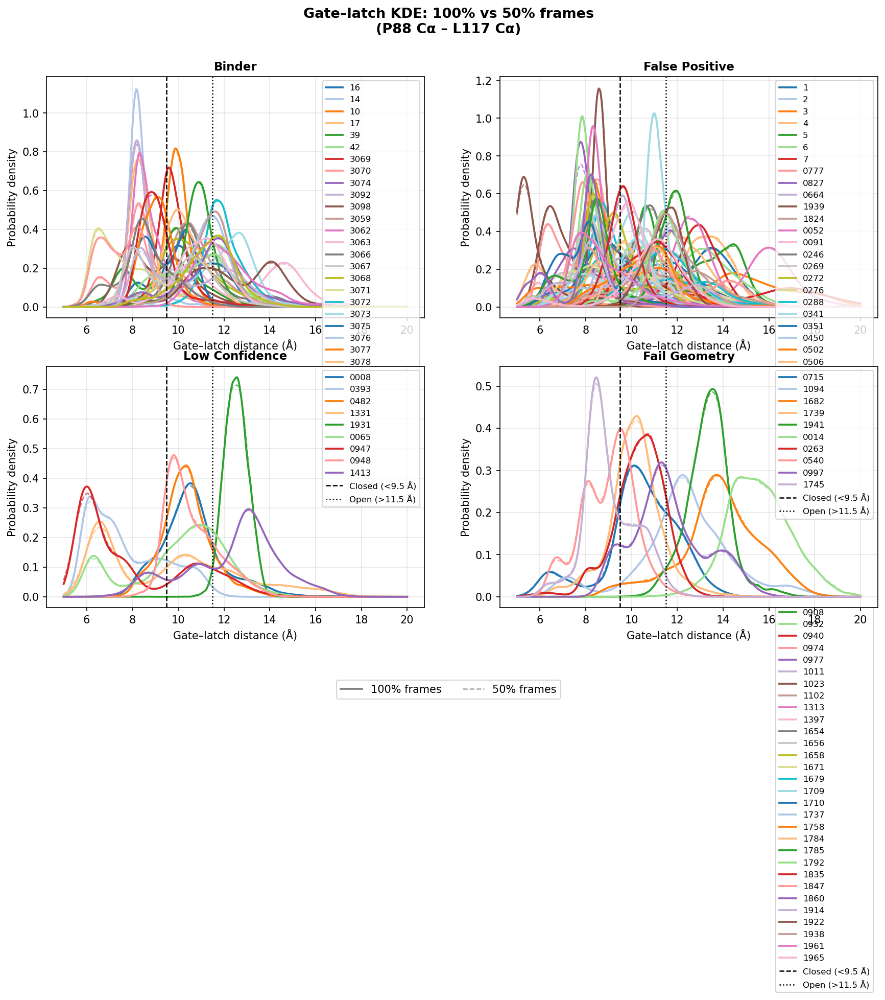

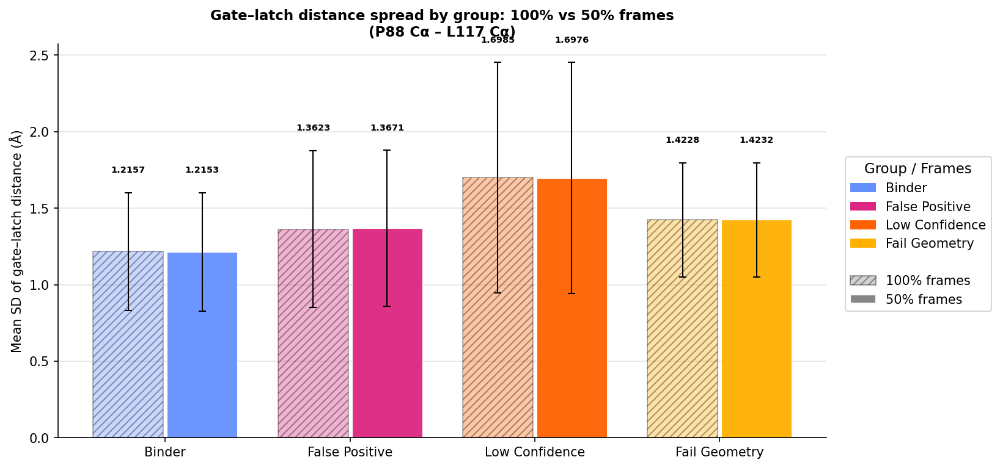

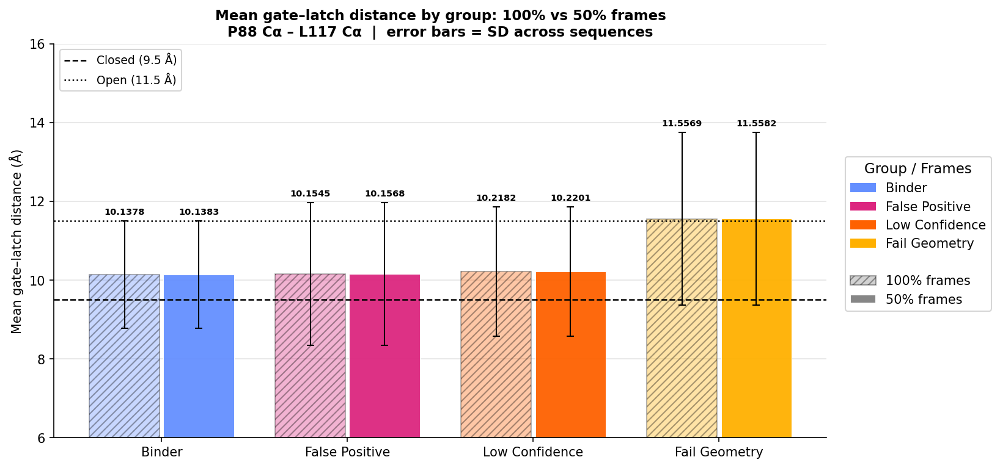

In [ ]:
# -------------------------------------------------------------------
# Gate-latch: 100% vs 50% frame comparison
# Requires the loading cell to have run (ts_data, group_seqs, etc.)
# Full-frame: solid KDE / hatched bars  |  50pct: dashed KDE / solid bars
# -------------------------------------------------------------------

HATCH  = "////"
BAR_W  = 0.38
OFFSET = 0.20

# ── Load 50pct timeseries ──────────────────────────────────────────
def load_timeseries_50(folder_name, seq_type):
    """Loads a sequence's gate-latch distance timeseries, last 50% of frames.

    Args:
        folder_name (str): Sequence's folder name.
        seq_type (str): Short seq_type key (e.g. "binder", "nb").

    Returns:
        numpy.ndarray | None: Distance in nm, or None if the file is
        missing (a warning is printed in that case).
    """
    filepath = os.path.join(base, TYPE_SUBDIR[seq_type], folder_name, runrel,
                            "gate_latch_timeseries_50pct.xvg")
    if not os.path.exists(filepath):
        print(f"WARNING: not found — {filepath}")
        return None
    _, dist = get_data(filepath)
    return dist

ts_data_50 = {}
for display_name, folder_name, seq_type in all_sequences:
    dist = load_timeseries_50(folder_name, seq_type)
    if dist is not None:
        ts_data_50[display_name] = dist

# ── Build summary DataFrames ───────────────────────────────────────
def build_gate_latch_df(ts_dict):
    """Builds a per-sequence gate-latch summary table from a timeseries dict.

    Args:
        ts_dict (dict[str, numpy.ndarray]): Maps display_name to a
            gate-latch distance timeseries in nm (see load_timeseries /
            load_timeseries_50).

    Returns:
        pandas.DataFrame: Indexed by Sequence, with Group, mean/SD (A),
        closed/open/intermediate percentages, and frame count.
    """
    rows = []
    for display_name, _, seq_type in all_sequences:
        if display_name not in ts_dict:
            continue
        dist  = ts_dict[display_name]
        n     = len(dist)
        closed = (dist < CLOSED_THRESHOLD).sum() / n
        open_  = (dist > OPEN_THRESHOLD).sum()   / n
        inter  = 1.0 - closed - open_
        rows.append({
            "Sequence":              display_name,
            "Group":                 TYPE_GROUP[seq_type],
            "Gate-latch mean (A)":   dist.mean()      * NM_TO_ANG,
            "Gate-latch SD (A)":     dist.std(ddof=1) * NM_TO_ANG,
            "Closed % (<9.5 A)":     closed * 100,
            "Open % (>11.5 A)":      open_  * 100,
            "Intermediate %":        inter  * 100,
            "N frames":              n,
        })
    return pd.DataFrame(rows).set_index("Sequence")

df_full_gl = build_gate_latch_df(ts_data)
df_50_gl   = build_gate_latch_df(ts_data_50)

# ── Helpers ────────────────────────────────────────────────────────
def bar_label_gl(ax, x_pos, height, sd, fmt="{:.4f}", fontsize=7):
    """Labels a bar in a gate-latch comparison plot with its value.

    Args:
        ax: Matplotlib Axes to draw on.
        x_pos (float): x position of the bar.
        height (float): Bar height (value to display).
        sd (float): Bar's error-bar size, used to place the label above it.
        fmt (str): Format string for the value (default: "{:.4f}").
        fontsize (int): Label font size (default: 7).
    """
    y = (height or 0) + (sd or 0) + 0.12
    ax.text(x_pos, y, fmt.format(height),
            ha="center", va="bottom", fontsize=fontsize,
            color="black", fontweight="bold")

def draw_bar_comparison(ax, x, vals_full, sds_full, vals_50, sds_50,
                        colors, ylabel, tick_labels):
    """Draws paired 100%-vs-50%-frames bars (hatched vs solid) per group.

    Args:
        ax: Matplotlib Axes to draw on.
        x: x positions, one per group.
        vals_full: Bar heights for the 100%-frames series.
        sds_full: Error-bar sizes for the 100%-frames series.
        vals_50: Bar heights for the 50%-frames series.
        sds_50: Error-bar sizes for the 50%-frames series.
        colors: Bar color per group.
        ylabel (str): y-axis label.
        tick_labels: x-tick labels, one per group.
    """
    for xi, (m, sd, c) in enumerate(zip(vals_full, sds_full, colors)):
        ax.bar(x[xi] - OFFSET, m, width=BAR_W,
               yerr=sd, color=c, alpha=0.35,
               hatch=HATCH, edgecolor="black",
               linewidth=0.8, capsize=3, error_kw={"elinewidth": 1})
        bar_label_gl(ax, x[xi] - OFFSET, m, sd)
    for xi, (m, sd, c) in enumerate(zip(vals_50, sds_50, colors)):
        ax.bar(x[xi] + OFFSET, m, width=BAR_W,
               yerr=sd, color=c, alpha=0.95,
               edgecolor="white", linewidth=0.5,
               capsize=3, error_kw={"elinewidth": 1})
        bar_label_gl(ax, x[xi] + OFFSET, m, sd)
    ax.set_xticks(x)
    ax.set_xticklabels(tick_labels, fontsize=10)
    ax.set_ylabel(ylabel, fontsize=10)
    ax.grid(True, axis="y", alpha=0.35)
    ax.set_axisbelow(True)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

def make_gl_legend(group_list, color_map):
    """Builds legend handles for group colors plus the 100%/50% bar styles.

    Args:
        group_list (list[str]): Group labels to include.
        color_map (dict[str, str]): Maps group label to color.

    Returns:
        list: Matplotlib Patch handles for use with ax.legend(handles=...).
    """
    handles  = [Patch(facecolor=color_map[g], label=g) for g in group_list]
    handles += [
        Patch(visible=False),
        Patch(facecolor="gray", alpha=0.35, hatch=HATCH,
              edgecolor="black", label="100% frames"),
        Patch(facecolor="gray", alpha=0.95,
              edgecolor="white", label="50% frames"),
    ]
    return handles

def build_group_stats(df, col_mean, col_sd=None):
    """Computes group-level mean and SD of a column, aligned to group_order.

    Args:
        df: DataFrame indexed by sequence, with a `col_mean` column.
        col_mean (str): Column to average within each group.
        col_sd: Unused; kept for call-site symmetry.

    Returns:
        tuple[list[float], list[float]]: (means, sds), one entry per
        group in group_order (NaN where a group has no data).
    """
    means, sds = [], []
    for group in group_order:
        seqs = group_seqs.get(group, [])
        vals = df.loc[df.index.isin(seqs), col_mean].dropna().values
        means.append(np.mean(vals)        if len(vals) > 0 else np.nan)
        sds.append(  np.std(vals, ddof=1) if len(vals) > 1 else np.nan)
    return means, sds


# ════════════════════════════════════════════════════════════════════
# Figure 1: KDE — solid = 100%, dashed = 50%, same color per sequence
# ════════════════════════════════════════════════════════════════════
x_grid = np.linspace(5.0, 20.0, 500)

fig1, axes1 = plt.subplots(2, 2, figsize=(14, 9), dpi=150, sharey=False)
axes1 = axes1.flatten()

for ax, group in zip(axes1, group_order):
    seqs_in_group = group_seqs.get(group, [])
    for i, display_name in enumerate(seqs_in_group):
        color = tab20(i % 20)
        label = truncate_label(display_name)

        if display_name in ts_data:
            kde_full = gaussian_kde(ts_data[display_name] * NM_TO_ANG,
                                    bw_method="scott")
            ax.plot(x_grid, kde_full(x_grid),
                    color=color, lw=1.8, ls="-", label=label)

        if display_name in ts_data_50:
            kde_50 = gaussian_kde(ts_data_50[display_name] * NM_TO_ANG,
                                  bw_method="scott")
            ax.plot(x_grid, kde_50(x_grid),
                    color=color, lw=1.2, ls="--", alpha=0.7, label="_nolegend_")

    ax.axvline(CLOSED_THRESHOLD * NM_TO_ANG, color="black", ls="--", lw=1.2,
               label=f"Closed (<{CLOSED_THRESHOLD*NM_TO_ANG:.1f} Å)")
    ax.axvline(OPEN_THRESHOLD   * NM_TO_ANG, color="black", ls=":",  lw=1.2,
               label=f"Open (>{OPEN_THRESHOLD*NM_TO_ANG:.1f} Å)")
    ax.set_xlabel("Gate–latch distance (Å)", fontsize=10)
    ax.set_ylabel("Probability density",     fontsize=10)
    ax.set_title(group, fontsize=11, fontweight="bold")
    ax.legend(ncol=1, fontsize=8)
    ax.grid(True, alpha=0.3)

# global style legend
from matplotlib.lines import Line2D
style_handles = [
    Line2D([0], [0], color="gray", lw=1.8, ls="-",  label="100% frames"),
    Line2D([0], [0], color="gray", lw=1.2, ls="--", label="50% frames", alpha=0.7),
]
fig1.legend(handles=style_handles, loc="lower center",
            ncol=2, fontsize=10, frameon=True,
            bbox_to_anchor=(0.5, -0.03))
fig1.suptitle("Gate–latch KDE: 100% vs 50% frames\n(P88 Cα – L117 Cα)",
              fontsize=13, fontweight="bold")
plt.tight_layout()


# ════════════════════════════════════════════════════════════════════
# Figure 2: group-average SD of gate-latch distance
# ════════════════════════════════════════════════════════════════════
# For SD comparison: compute mean-of-SDs and SD-of-SDs per group
def group_sd_stats(ts_dict):
    """Computes mean-of-SDs and SD-of-SDs of gate-latch distance per group.

    Args:
        ts_dict (dict[str, numpy.ndarray]): Maps display_name to a
            gate-latch distance timeseries in nm.

    Returns:
        tuple[list[float], list[float]]: (means, sds) of per-sequence SD
        (Angstrom), one entry per group in group_order.
    """
    means, sds = [], []
    for group in group_order:
        seqs = group_seqs.get(group, [])
        sd_vals = [ts_dict[dn].std(ddof=1) * NM_TO_ANG
                   for dn in seqs if dn in ts_dict]
        means.append(np.mean(sd_vals)        if sd_vals        else np.nan)
        sds.append(  np.std(sd_vals, ddof=1) if len(sd_vals)>1 else np.nan)
    return means, sds

sd_means_full, sd_sds_full = group_sd_stats(ts_data)
sd_means_50,   sd_sds_50   = group_sd_stats(ts_data_50)

x2      = np.arange(len(group_order))
colors2 = [GROUP_COLOR[g] for g in group_order]

fig2, ax2 = plt.subplots(figsize=(9, 5), dpi=150, constrained_layout=True)
draw_bar_comparison(ax2, x2,
                    sd_means_full, sd_sds_full,
                    sd_means_50,   sd_sds_50,
                    colors2,
                    ylabel="Mean SD of gate–latch distance (Å)",
                    tick_labels=group_order)
ax2.set_title("Gate–latch distance spread by group: 100% vs 50% frames\n"
              "(P88 Cα – L117 Cα)", fontsize=11, fontweight="bold")
fig2.legend(handles=make_gl_legend(group_order, GROUP_COLOR),
            loc="center left", bbox_to_anchor=(1.01, 0.5),
            fontsize=10, frameon=True,
            title="Group / Frames", title_fontsize=11)


# ════════════════════════════════════════════════════════════════════
# Figure 3: group mean gate-latch distance ± SD
# ════════════════════════════════════════════════════════════════════
mean_means_full, mean_sds_full = build_group_stats(df_full_gl, "Gate-latch mean (A)")
mean_means_50,   mean_sds_50   = build_group_stats(df_50_gl,   "Gate-latch mean (A)")

x3      = np.arange(len(group_order))
colors3 = [GROUP_COLOR[g] for g in group_order]

fig3, ax3 = plt.subplots(figsize=(9, 5), dpi=150, constrained_layout=True)
draw_bar_comparison(ax3, x3,
                    mean_means_full, mean_sds_full,
                    mean_means_50,   mean_sds_50,
                    colors3,
                    ylabel="Mean gate–latch distance (Å)",
                    tick_labels=group_order)
ax3.axhline(CLOSED_THRESHOLD * NM_TO_ANG, color="black", ls="--", lw=1.2,
            label=f"Closed ({CLOSED_THRESHOLD*NM_TO_ANG:.1f} Å)")
ax3.axhline(OPEN_THRESHOLD   * NM_TO_ANG, color="black", ls=":",  lw=1.2,
            label=f"Open ({OPEN_THRESHOLD*NM_TO_ANG:.1f} Å)")
ax3.set_ylim(6, 16)
ax3.set_title("Mean gate–latch distance by group: 100% vs 50% frames\n"
              "P88 Cα – L117 Cα  |  error bars = SD across sequences",
              fontsize=11, fontweight="bold")
ax3.legend(fontsize=9, loc="upper left")
fig3.legend(handles=make_gl_legend(group_order, GROUP_COLOR),
            loc="center left", bbox_to_anchor=(1.01, 0.5),
            fontsize=10, frameon=True,
            title="Group / Frames", title_fontsize=11)

plt.show()

# fig1.savefig(os.path.join(base, "analysis", "gate_latch_kde_compare_50pct.png"),        dpi=300, bbox_inches="tight")
fig2.savefig(os.path.join(base, "analysis", "gate_latch_SD_compare_50pct.png"),         dpi=300, bbox_inches="tight")
fig3.savefig(os.path.join(base, "analysis", "gate_latch_mean_compare_50pct.png"),       dpi=300, bbox_inches="tight")

## Reduced time analysis

Loaded 130 / 130 sequences from 'gate_latch_timeseries.xvg'


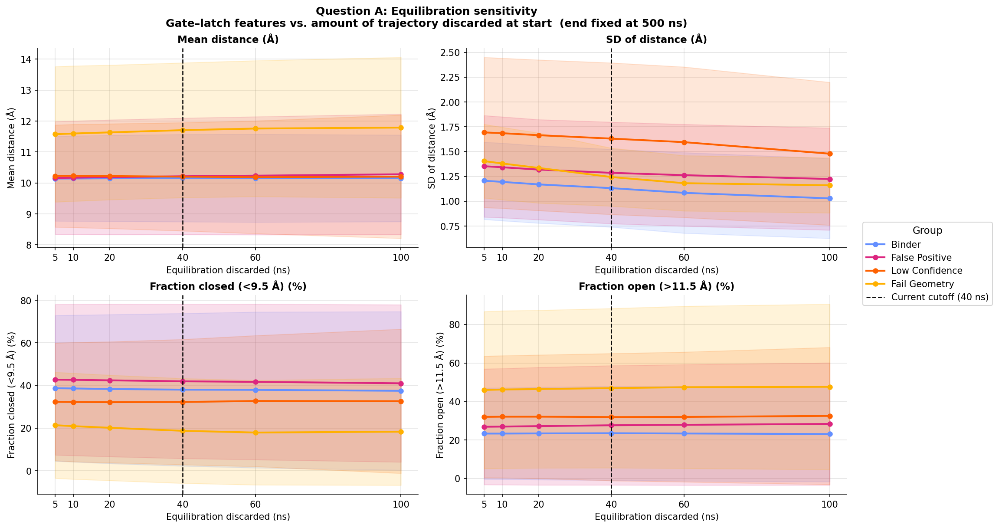

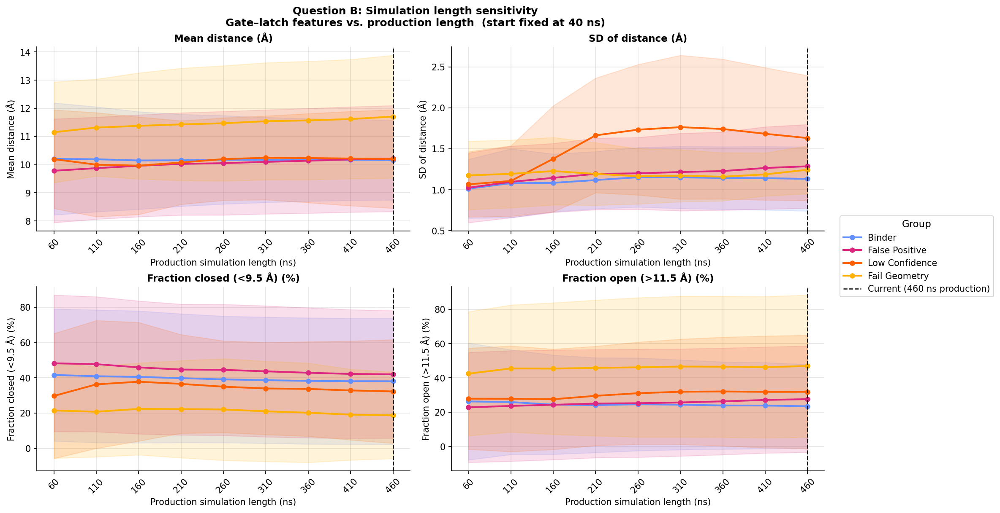


── Question A: equilibration cutoff ──
  Start (ns)    Binder        False Posi    Low Confid    Fail Geome  
  5               10.142 Å      10.162 Å      10.226 Å      11.576 Å  
  10              10.144 Å      10.170 Å      10.229 Å      11.599 Å  
  20              10.151 Å      10.188 Å      10.223 Å      11.636 Å  
  40              10.160 Å      10.217 Å      10.204 Å      11.707 Å   ← current
  60              10.155 Å      10.236 Å      10.187 Å      11.759 Å  
  100             10.153 Å      10.282 Å      10.205 Å      11.790 Å  

── Question B: simulation length ──
  Prod (ns)     Binder        False Posi    Low Confid    Fail Geome  
  60              10.206 Å       9.784 Å      10.196 Å      11.151 Å  
  110             10.192 Å       9.876 Å      10.001 Å      11.317 Å  
  160             10.150 Å       9.960 Å       9.965 Å      11.377 Å  
  210             10.156 Å      10.027 Å      10.077 Å      11.430 Å  
  260             10.174 Å      10.053 Å      10.198 Å      1

In [16]:
# Temporal convergence analysis. Uses all_sequences, group_seqs,
# group_order, GROUP_COLOR, NM_TO_ANG, CLOSED_THRESHOLD, OPEN_THRESHOLD
# already in scope from the previous cell.
#
# Question A: how much equilibration time needs discarding? Fix
# end=500 ns, vary start: 5/10/20/40/60/100 ns.
# Question B: how long does production need to be? Fix start=40 ns,
# vary end: 100/150/200/250/300/350/400/450/500 ns.

# Config: timeseries file to analyze
XVG_FILENAME = "gate_latch_timeseries.xvg"   # ← change as needed
DT_PS        = 37.5                               # ps per frame

# ── Load timeseries ───────────────────────────────────────────────
ts_data_conv = {}   # {display_name: dist_nm array}

for display_name, folder_name, seq_type in all_sequences:
    filepath = os.path.join(
        base, TYPE_SUBDIR[seq_type], folder_name, runrel, XVG_FILENAME
    )
    if not os.path.exists(filepath):
        print(f"WARNING: not found — {filepath}")
        continue
    _, dist = get_data(filepath)
    ts_data_conv[display_name] = dist   # nm

print(f"Loaded {len(ts_data_conv)} / {len(all_sequences)} sequences "
      f"from '{XVG_FILENAME}'")

# Window grids
START_NS = [5, 10, 20, 40, 60, 100]          # Question A: start times
END_NS   = [100, 150, 200, 250, 300,
            350, 400, 450, 500]               # Question B: end times
EQUIL_NS = 40                                 # current equilibration cutoff

FEAT_LABELS = {
    "mean":        "Mean distance (Å)",
    "sd":          "SD of distance (Å)",
    "frac_closed": "Fraction closed (<9.5 Å) (%)",
    "frac_open":   "Fraction open (>11.5 Å) (%)",
}

def ns_to_idx(ns):
    """Converts a time in ns to a frame index, given DT_PS spacing.

    Args:
        ns (float): Time in nanoseconds.

    Returns:
        int: Frame index.
    """
    return int(ns * 1000 / DT_PS)

def compute_features_window(dist_nm, start_idx, end_idx=None):
    """Computes gate-latch summary features over a frame window.

    Args:
        dist_nm: Full gate-latch distance timeseries, in nm.
        start_idx (int): Start frame index of the window.
        end_idx (int | None): End frame index of the window (default:
            None, meaning to the end of the array).

    Returns:
        dict | None: mean, sd (Angstrom), frac_closed, frac_open
        (percent), or None if the window has fewer than 50 frames.
    """
    seg = dist_nm[start_idx:end_idx]
    if len(seg) < 50:
        return None
    return {
        "mean":        seg.mean()              * NM_TO_ANG,
        "sd":          seg.std(ddof=1)         * NM_TO_ANG,
        "frac_closed": (seg < CLOSED_THRESHOLD).mean() * 100,
        "frac_open":   (seg > OPEN_THRESHOLD).mean()   * 100,
    }

# ── Compute features at every window for every sequence ───────────
# results_A[display_name][start_ns] = feature dict
# results_B[display_name][end_ns]   = feature dict

results_A, results_B = {}, {}

for display_name, dist in ts_data_conv.items():
    results_A[display_name] = {}
    for s_ns in START_NS:
        feats = compute_features_window(dist, ns_to_idx(s_ns))
        if feats:
            results_A[display_name][s_ns] = feats

    results_B[display_name] = {}
    for e_ns in END_NS:
        feats = compute_features_window(dist, ns_to_idx(EQUIL_NS),
                                              ns_to_idx(e_ns))
        if feats:
            results_B[display_name][e_ns] = feats

# ── Helper: group mean ± SD at each window step ───────────────────
def group_convergence(results, window_vals, feat_key):
    """Aggregates a per-sequence feature into group mean/SD per window.

    Args:
        results (dict): Maps display_name to {window_val: feature_dict},
            as built by compute_features_window.
        window_vals (list): Window values (start_ns or end_ns) to
            aggregate over.
        feat_key (str): Feature to pull from each feature_dict (one of
            FEAT_LABELS' keys).

    Returns:
        dict[str, tuple[numpy.ndarray, numpy.ndarray]]: Maps group label
        to (means, sds) arrays aligned to window_vals.
    """
    out = {}
    for group in group_order:
        seqs = group_seqs.get(group, [])
        means_per_window, sds_per_window = [], []
        for w in window_vals:
            vals = [results[dn][w][feat_key]
                    for dn in seqs
                    if dn in results and w in results[dn]]
            means_per_window.append(np.mean(vals)        if vals        else np.nan)
            sds_per_window.append(  np.std(vals, ddof=1) if len(vals)>1 else np.nan)
        out[group] = (np.array(means_per_window), np.array(sds_per_window))
    return out


# ════════════════════════════════════════════════════════════════════
# Figure A: equilibration sensitivity (vary start, fix end=500 ns)
# ════════════════════════════════════════════════════════════════════
fig_a, axes_a = plt.subplots(2, 2, figsize=(13, 8), dpi=150,
                              constrained_layout=True)
axes_a = axes_a.flatten()

for ax, (feat_key, feat_label) in zip(axes_a, FEAT_LABELS.items()):
    gc = group_convergence(results_A, START_NS, feat_key)

    for group in group_order:
        means, sds = gc[group]
        color = GROUP_COLOR[group]
        ax.plot(START_NS, means, color=color, lw=2.0,
                marker="o", ms=5, label=group)
        ax.fill_between(START_NS,
                        means - sds, means + sds,
                        color=color, alpha=0.15)

    ax.axvline(EQUIL_NS, color="black", ls="--", lw=1.2,
               label=f"Current cutoff ({EQUIL_NS} ns)")
    ax.set_xlabel("Equilibration discarded (ns)", fontsize=10)
    ax.set_ylabel(feat_label, fontsize=10)
    ax.set_title(feat_label, fontsize=11, fontweight="bold")
    ax.set_xticks(START_NS)
    ax.grid(True, alpha=0.35)
    ax.set_axisbelow(True)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

# shared legend
handles_a = [plt.Line2D([0],[0], color=GROUP_COLOR[g], lw=2, marker="o",
                         ms=5, label=g) for g in group_order]
handles_a += [plt.Line2D([0],[0], color="black", lw=1.2, ls="--",
                          label=f"Current cutoff ({EQUIL_NS} ns)")]
fig_a.legend(handles=handles_a, loc="center left",
             bbox_to_anchor=(1.01, 0.5), fontsize=10, frameon=True,
             title="Group", title_fontsize=11)
fig_a.suptitle(
    "Question A: Equilibration sensitivity\n"
    "Gate–latch features vs. amount of trajectory discarded at start  "
    "(end fixed at 500 ns)",
    fontsize=12, fontweight="bold"
)


# ════════════════════════════════════════════════════════════════════
# Figure B: simulation length sensitivity (fix start=40 ns, vary end)
# ════════════════════════════════════════════════════════════════════
fig_b, axes_b = plt.subplots(2, 2, figsize=(13, 8), dpi=150,
                              constrained_layout=True)
axes_b = axes_b.flatten()

production_ns = [e - EQUIL_NS for e in END_NS]   # actual production time

for ax, (feat_key, feat_label) in zip(axes_b, FEAT_LABELS.items()):
    gc = group_convergence(results_B, END_NS, feat_key)

    for group in group_order:
        means, sds = gc[group]
        color = GROUP_COLOR[group]
        ax.plot(production_ns, means, color=color, lw=2.0,
                marker="o", ms=5, label=group)
        ax.fill_between(production_ns,
                        means - sds, means + sds,
                        color=color, alpha=0.15)

    ax.axvline(500 - EQUIL_NS, color="black", ls="--", lw=1.2,
               label=f"Current ({500-EQUIL_NS} ns production)")
    ax.set_xlabel("Production simulation length (ns)", fontsize=10)
    ax.set_ylabel(feat_label, fontsize=10)
    ax.set_title(feat_label, fontsize=11, fontweight="bold")
    ax.set_xticks(production_ns)
    ax.set_xticklabels([str(p) for p in production_ns], rotation=45)
    ax.grid(True, alpha=0.35)
    ax.set_axisbelow(True)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

handles_b = [plt.Line2D([0],[0], color=GROUP_COLOR[g], lw=2, marker="o",
                         ms=5, label=g) for g in group_order]
handles_b += [plt.Line2D([0],[0], color="black", lw=1.2, ls="--",
                          label=f"Current ({500-EQUIL_NS} ns production)")]
fig_b.legend(handles=handles_b, loc="center left",
             bbox_to_anchor=(1.01, 0.5), fontsize=10, frameon=True,
             title="Group", title_fontsize=11)
fig_b.suptitle(
    "Question B: Simulation length sensitivity\n"
    "Gate–latch features vs. production length  "
    f"(start fixed at {EQUIL_NS} ns)",
    fontsize=12, fontweight="bold"
)

plt.show()

# ── Print convergence summary ──────────────────────────────────────
print("\n── Question A: equilibration cutoff ──")
print(f"  {'Start (ns)':<12}", end="")
for g in group_order:
    print(f"  {g[:10]:<12}", end="")
print()
for s_ns in START_NS:
    marker = " ← current" if s_ns == EQUIL_NS else ""
    print(f"  {s_ns:<12}", end="")
    for group in group_order:
        seqs = group_seqs.get(group, [])
        vals = [results_A[dn][s_ns]["mean"]
                for dn in seqs if dn in results_A and s_ns in results_A[dn]]
        m = np.mean(vals) if vals else float("nan")
        print(f"  {m:>8.3f} Å  ", end="")
    print(marker)

print("\n── Question B: simulation length ──")
print(f"  {'Prod (ns)':<12}", end="")
for g in group_order:
    print(f"  {g[:10]:<12}", end="")
print()
for e_ns, p_ns in zip(END_NS, production_ns):
    marker = " ← current" if e_ns == 500 else ""
    print(f"  {p_ns:<12}", end="")
    for group in group_order:
        seqs = group_seqs.get(group, [])
        vals = [results_B[dn][e_ns]["mean"]
                for dn in seqs if dn in results_B and e_ns in results_B[dn]]
        m = np.mean(vals) if vals else float("nan")
        print(f"  {m:>8.3f} Å  ", end="")
    print(marker)

# fig_a.savefig(os.path.join(base, "analysis", "convergence_equil_cutoff.png"),   dpi=300, bbox_inches="tight")
# fig_b.savefig(os.path.join(base, "analysis", "convergence_sim_length.png"),     dpi=300, bbox_inches="tight")